In [1]:
%matplotlib inline

In [2]:
from datetime import datetime
import os
from os.path import dirname, abspath, join
from os import getcwd
import sys

In [3]:
import random
import string
import pandas as pd
import numpy as np

In [4]:
np.set_printoptions(formatter={'float': '{: 0.3f}'.format})

In [5]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

In [6]:
import torch
import socket
from IPython.display import clear_output

In [7]:
import itertools
import multiprocessing as mp

In [8]:
# seed_arg = int(sys.argv[1])
# print ("\n\nSeed ARG: ",seed_arg)
seed_arg = 0

In [9]:
seedlist = np.array([161, 314, 228, 271828, 230, 4271031, 5526538, 6610165, 9849252, 34534, 73422, 8765])
seed = seedlist[seed_arg]
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)

In [10]:
class ENO(object):
    
    #no. of forecast types is 6 ranging from 0 to 5
  
    def __init__(self, location='tokyo', year=2010, shuffle=False, day_balance=False):
        self.location = location
        self.year = year
        self.day = None
        self.hr = None
        
        self.shuffle = shuffle
        self.day_balance = day_balance

        self.TIME_STEPS = None #no. of time steps in one episode
        self.NO_OF_DAYS = None #no. of days in one year
        
        self.NO_OF_DAYTYPE = 10 #no. of daytypes
        self.daycounter = 0 #to count number of days that have been passed
        
        self.sradiation = None #matrix with GSR for the entire year
        self.senergy = None #matrix with harvested energy data for the entire year
        self.fforecast = None #array with forecast values for each day
        

        self.henergy = None #harvested energy variable
        self.fcast = None #forecast variable
        self.sorted_days = [] #days sorted according to day type
        
        self.SMAX = 1000 # 1 Watt Solar Panel

    
    #function to get the solar data for the given location and year and prep it
    def get_data(self):
        #solar_data/CSV files contain the values of GSR (Global Solar Radiation in MegaJoules per meters squared per hour)
        #weather_data/CSV files contain the weather summary from 06:00 to 18:00 and 18:00 to 06:00+1
        location = self.location
        year = self.year

        THIS_DIR = getcwd()
        SDATA_DIR = abspath(join(THIS_DIR, 'solar_data'))  #abspath(join(THIS_DIR, '../../..', 'data'))
        
        sfile = SDATA_DIR + '/' + location +'/' + str(year) + '.csv'
        
        #skiprows=4 to remove unnecessary title texts
        #usecols=4 to read only the Global Solar Radiation (GSR) values
        solar_radiation = pd.read_csv(sfile, skiprows=4, encoding='shift_jisx0213', usecols=[4])
      
        #convert dataframe to numpy array
        solar_radiation = solar_radiation.values

        #convert missing data in CSV files to zero
        solar_radiation[np.isnan(solar_radiation)] = 0

        #reshape solar_radiation into no_of_daysx24 array
        solar_radiation = solar_radiation.reshape(-1,24)

        if(self.shuffle): #if class instatiation calls for shuffling the day order. Required when learning
            np.random.shuffle(solar_radiation) 
        self.sradiation = solar_radiation
        
        #GSR values (in MJ/sq.mts per hour) need to be expressed in mW
        # Conversion is accomplished by 
        # solar_energy = GSR(in MJ/m2/hr) * 1e6 * size of solar cell * efficiency of solar cell /(60x60) *1000 (to express in mW)
        # the factor of 2 in the end is assuming two solar cells
        self.senergy = 2*self.sradiation * 1e6 * (55e-3 * 70e-3) * 0.15 * 1000/(60*60)

        return 0
    
    #function to map total day radiation into type of day ranging from 0 to 5
    #the classification into day types is quite arbitrary. There is no solid logic behind this type of classification.
    
    def get_day_state(self,tot_day_radiation):
        bin_edges = np.array([0, 3.5, 6.5, 9.0, 12.5, 15.5, 18.5, 22.0, 25, 28])
        for k in np.arange(1,bin_edges.size):
            if (bin_edges[k-1] <= tot_day_radiation <= bin_edges[k]):
                day_state = k -1
                break
            else:
                day_state = bin_edges.size - 1
        return int(day_state)
    
    def get_forecast(self):
        #create a perfect forecaster.
        tot_day_radiation = np.sum(self.sradiation, axis=1) #contains total solar radiation for each day
        get_day_state = np.vectorize(self.get_day_state)
        self.fforecast = get_day_state(tot_day_radiation)
        
        #sort days depending on the type of day and shuffle them; maybe required when learning
        for fcast in range(0,6):
            fcast_days = ([i for i,x in enumerate(self.fforecast) if x == fcast])
            np.random.shuffle(fcast_days)
            self.sorted_days.append(fcast_days)
        return 0
    
    def reset(self,day=0): #it is possible to reset to the beginning of a certain day
        
        self.get_data() #first get data for the given year
        self.get_forecast() #calculate the forecast
        
        self.TIME_STEPS = self.senergy.shape[1]
        self.NO_OF_DAYS = self.senergy.shape[0]
        
        self.day = day
        self.hr = 0
        
        self.henergy = self.senergy[self.day][self.hr]
        self.fcast = self.fforecast[self.day]
        
        end_of_day = False
        end_of_year = False
        return [self.henergy, self.fcast, end_of_day, end_of_year]

    
    def step(self):
        end_of_day = False
        end_of_year = False
        if not(self.day_balance): #if daytype balance is not required
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr] 
                self.fcast = self.fforecast[self.day]
            else:
                if(self.day < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.hr = 0
                    self.day += 1
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else:
                    end_of_day = True
                    end_of_year = True

                    
        else: #when training, we want all daytypes to be equally represented for robust policy
              #obviously, the days are going to be in random order
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr]
                self.fcast = self.fforecast[self.day]
            else:
                if(self.daycounter < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.daycounter += 1
                    self.hr = 0
                    daytype = random.choice(np.arange(0,self.NO_OF_DAYTYPE)) #choose random daytype
                    self.day = np.random.choice(self.sorted_days[daytype]) #choose random day from that daytype
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else: 
                    end_of_day = True
                    end_of_year = True
                    self.daycounter = 0
        
        return [self.henergy, self.fcast, end_of_day, end_of_year]

In [11]:
class CAPM (object):
    def __init__(self,location='tokyo', year=2010, shuffle=False, trainmode=False):

        #all energy values i.e. BMIN, BMAX, BOPT, HMAX are in mWhr. Assuming one timestep is one hour
        
        self.BMIN = 50.0                #Minimum battery level that is tolerated. Maybe non-zero also
        self.BMAX = 10000.0            #Max Battery Level. May not necessarily be equal to total batter capacity [3.6V x 2500mAh]
        self.BOPT = 0.5 * self.BMAX    #Optimal Battery Level. Assuming 50% of battery is the optimum
        self.BLIM_LO = 0.15*self.BMAX
        self.BLIM_HI = 0.85*self.BMAX
        self.BSAFE_LO = 0.35*self.BMAX
        self.BSAFE_HI = 0.65*self.BMAX
        
        self.ENP_MARGIN = 0.3*self.BMAX

        
        self.HMIN = 0      #Minimum energy that can be harvested by the solar panel.
        self.HMAX = None   #Maximum energy that can be harvested by the solar panel. [500mW]
        
        self.DMAX = 500      #Maximum energy that can be consumed by the node in one time step. [~ 3.6V x 135mA]
        self.N_ACTIONS = 10  #No. of different duty cycles possible
        self.DMIN = self.DMAX/self.N_ACTIONS #Minimum energy that can be consumed by the node in one time step. [~ 3.6V x 15mA]
        
        self.binit = None     #battery at the beginning of day
        self.btrack = []      #track the battery level for each day
        self.v_btrack = []      #track the virtual battery level for each day

        self.atrack = []      #track the duty cycles for each day
        self.htrack = []      #track the harvested for each day
        self.batt = None      #battery variable
        self.enp = None       #enp at end of hr
        self.henergy = None   #harvested energy variable
        self.fcast = None     #forecast variable
        
        self.MUBATT = 0.6
        self.SDBATT = 0.02
        
        self.MUHENERGY = 0.5
        self.SDHENERGY = 0.2
        
        self.MUENP = 0
        self.SDENP = 0.02
        
        self.location  = location
        self.year      = year
        self.shuffle   = shuffle
        self.trainmode = trainmode
        self.eno       = None
        
        self.day_violation_flag = False
        self.violation_flag     = False
        self.violation_counter  = 0
        self.batt_full_counter  = 0
        self.batt_empty_counter = 0
        
        self.batt_violations    = 0

        self.NO_OF_DAYTYPE      = 10 #no. of daytypes
 
    def reset(self,day=0,batt=-1):
        henergy, fcast, day_end, year_end = self.eno.reset(day) #reset the eno environment
        self.violation_flag = False
        self.violation_counter = 0
        self.batt_violations = 0
        
        if(batt == -1):
            self.batt = self.BOPT
        else:
            self.batt = batt
            
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX)
        self.binit = self.batt
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        self.v_btrack = np.append(self.v_btrack, self.batt) #track battery levels
#         self.enp = self.BOPT - self.batt
        self.enp = self.binit - self.batt #enp is calculated
        self.henergy = np.clip(henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
        self.fcast = fcast
        
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        reward = 0
        
        return [c_state, reward, day_end, year_end]
    
    def getstate(self): #query the present state of the system
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        return c_state
        
    
    #reward function
    def rewardfn(self):
        violation_penalty = 0
        bmean = np.mean(self.btrack)
        bdev = self.BOPT - bmean
        if np.abs(bdev) > (self.BOPT - self.ENP_MARGIN):
            reward = 1.5-np.abs(bdev)/self.BMAX*5
        else:
            reward = 1
#         reward = 2 - 20*np.abs(bdev)/self.BMAX
#         if(self.day_violation_flag):
#             violation_penalty += 3    #penalty for violating battery limits anytime during the day
        return np.clip(reward,-1,1)#(reward - violation_penalty)
    
    
    
    def step(self, action):
        day_end = False
        year_end = False
        self.violation_flag = False
        reward = 0
        self.atrack = np.append(self.atrack, action+1) #track duty cycles
        self.htrack = np.append(self.htrack, self.henergy)

#         action_var = np.abs(np.mean(self.atrack) - action)/9 #can vary from 0 to 1
#         reward += 0.25*(0.5 - action_var ) #reward penalizing high duty cycle variance [-0.5 to 0.5]*0.25
      
        action = np.clip(action, 0, self.N_ACTIONS-1) #action values range from (0 to N_ACTIONS-1)
        e_consumed = (action+1)*self.DMAX/self.N_ACTIONS   #energy consumed by the node
        
        
        self.batt += (self.henergy - e_consumed)
        
#         v_batt = self.binit + self.htrack.sum() - self.atrack.sum()*self.DMAX/self.N_ACTIONS
#         self.v_btrack = np.append(self.v_btrack, v_batt) #track battery levels
        
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
                self.batt_violations += 1
        
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
#         if(self.batt < self.BLIM_LO or self.batt > self.BLIM_HI ):
            self.violation_flag = True #penalty for violating battery limits everytime it happens
#             reward -= 2
#             if(self.batt < self.BLIM_LO): #battery depletion is more fatal than battery overflow
#                 reward -= 2

        if(self.batt <= self.BMIN ): 
            self.batt_empty_counter += 1
        if(self.batt >= self.BMAX ): 
            self.batt_full_counter  += 1

        if(self.violation_flag):
            if(self.day_violation_flag == False): #penalty for violating battery limits anytime during the day - triggers once everyday
                self.violation_counter += 1
                self.day_violation_flag = True
                
        #calculate ENP before clipping
#         self.enp = self.BOPT - self.batt
        self.enp = self.binit - self.batt
        
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX) #clip battery values within permitted level
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        
        
        #proceed to the next time step
       
        self.henergy, self.fcast, day_end, year_end = self.eno.step()
        self.henergy = np.clip(self.henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
                        
        if(day_end): #if eno object flags that the day has ended then give reward
            reward += self.rewardfn()
            if (self.trainmode): #reset battery to optimal level if limits are exceeded when training
#                 self.batt = np.random.uniform(self.DMAX*self.eno.TIME_STEPS/self.BMAX,0.8)*self.BMAX
#                 if (self.violation_flag):
                if np.random.uniform() < HELP : #occasionaly reset the battery
                    self.batt = self.BOPT  
            
            self.day_violation_flag = False
            self.binit = self.batt #this will be the new initial battery level for next day
            self.btrack = [] #clear battery tracker
#             self.v_btrack = [] #clear battery tracker
            self.atrack = [] #clear duty cycle tracker
            self.htrack = [] #clear henergy tracker
   
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states
        
        return [c_state, reward, day_end, year_end]

In [12]:
RNDM_STRING = ''.join(random.choices(string.ascii_uppercase + string.digits, k=8))# + datetime.now().strftime("_%H_%M_%S")

LOCATION       = 'tokyo'
NAME           = 'DENO'+ RNDM_STRING+ '_'+datetime.now().strftime("_%H_%M_%S")+"_"
MODEL_FILENAME = './models/'+ NAME + '_' + str(seed) + '.pt'
print("\nMODEL : ", MODEL_FILENAME)
print("SEED  : ",seed_arg)
print("HOST  : ",socket.gethostname())
print("START : ",datetime.now())


MODEL :  ./models/DENOSTI6WR1Z__18_38_07__161.pt
SEED  :  0
HOST  :  19c994a59e65
START :  2019-07-04 18:38:07.125240


In [13]:
# Hyper Parameters
BATCH_SIZE          = 32
WT_DECAY            = None
LR                  = 1e-4          # learning rate
EPSILON             = 0.9           # greedy policy
GAMMA               = 0.99           # reward discount
LAMBDA              = 0.95          # parameter decay
TARGET_REPLACE_ITER = 24*7*4*18     # target update frequency
MEMORY_CAPACITY     = 24*7*4*12*3*10   # store upto six month worth of memory   

N_ACTIONS           = 10            # no. of duty cycles (0,1,2,3,4)
N_STATES            = 4             # number of state space parameter [batt, enp, henergy, fcast]

HIDDEN_LAYER        = 50            # width of NN
NN_ITERATIONS       = 1000
GPU                 = False         # device
HELP                = 0.05
print("HYPERPARAMETERS")

HYPERPARAMETERS


In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

#Class definitions for NN model and learning algorithm
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        self.fc1 = nn.Linear(N_STATES, HIDDEN_LAYER)
        nn.init.kaiming_uniform_(self.fc1.weight)

        self.adv = nn.Linear(HIDDEN_LAYER, N_ACTIONS)
        nn.init.xavier_uniform_(self.adv.weight) 
    
        self.val = nn.Linear(HIDDEN_LAYER, 1)
        nn.init.xavier_uniform_(self.val.weight)
        
    def forward(self, x):
        x = self.fc1(x)
        x = F.relu(x)

        adv = self.adv(x)
        val = self.val(x)
        
        return val + adv - adv.mean()
    
class DQN(object):
    def __init__(self):
        if(GPU): 
            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        else:
            device = torch.device('cpu')
        self.eval_net, self.target_net = Net(), Net()
        self.eval_net.to(device)
        self.target_net.to(device)
        self.device = device

        self.learn_step_counter = 0                                     # for target updating
        self.memory_counter = 0                                         # for storing memory
        self.memory = np.zeros((MEMORY_CAPACITY, N_STATES * 2 + 2))     # initialize memory [mem: ([s], a, r, [s_]) ]
        self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR)

        self.running_loss = 0.0
        
        self.loss_func = nn.MSELoss()
        self.nettoggle = False

    
#     def choose_action(self, x):
#         x = torch.unsqueeze(torch.FloatTensor(x), 0)
#         x = x.to(self.device)

#         actions_value = self.eval_net.forward(x)
#         actions_value = actions_value.to(torch.device("cpu"))
#         action = torch.max(actions_value, 1)[1].data.numpy()
#         action = action[0] # return the argmax index
#         if np.random.uniform() > EPSILON:   # greedy
# #             action += np.random.randint(-3, 3)
# #             action = int(np.clip(action, 0, N_ACTIONS-1))
# #             action = np.random.randint(0,N_ACTIONS)
#             action = np.random.choice(np.arange(0, N_ACTIONS), p=[0.55, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05])

#         return action
    
    def choose_greedy_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        actions_value = self.eval_net.forward(x)
        actions_value = actions_value.to(torch.device("cpu"))
        action = torch.max(actions_value, 1)[1].data.numpy().flatten()
        action = action[0] # return the argmax index
        
        return action

    def store_transition(self, s, a, r, s_):
        transition = np.hstack((s, [a, r], s_))
        # replace the old memory with new memory
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory[index, :] = transition
        self.memory_counter += 1
    
    def store_day_transition(self, transition_rec):
        data = transition_rec
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory= np.insert(self.memory, index, data,0)
        self.memory_counter += transition_rec.shape[0]

    def learn(self):
        # target parameter update
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            self.target_net.load_state_dict(self.eval_net.state_dict())
            self.nettoggle = not self.nettoggle
        self.learn_step_counter += 1

        # sample batch transitions
        sample_index_limit = min(MEMORY_CAPACITY, self.memory_counter)
        sample_index = np.random.choice(sample_index_limit, BATCH_SIZE)
#         sample_index = np.random.choice(MEMORY_CAPACITY, BATCH_SIZE)
        b_memory = self.memory[sample_index, :]
        b_s = torch.FloatTensor(b_memory[:, :N_STATES])
        b_a = torch.LongTensor(b_memory[:, N_STATES:N_STATES+1].astype(int))
        b_r = torch.FloatTensor(b_memory[:, N_STATES+1:N_STATES+2])
        b_s_ = torch.FloatTensor(b_memory[:, -N_STATES:])
        
        b_s = b_s.to(self.device)
        b_a = b_a.to(self.device)
        b_r = b_r.to(self.device)
        b_s_ = b_s_.to(self.device)

        # q_eval w.r.t the action in experience
        q_eval   = self.eval_net(b_s).gather(1, b_a)  # shape (batch, 1)
        a_eval   = self.eval_net(b_s).max(1)[1].view(BATCH_SIZE, 1) #best action according to eval_net
        q_next   = self.target_net(b_s_).detach()     # detach from graph, don't backpropagate
        q_target = b_r + GAMMA * q_next.gather(1, a_eval)   # shape (batch, 1)
        loss     = self.loss_func(q_eval, q_target)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        
        self.running_loss += loss.mean().item()
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            print('LOSS : %.3f' %(self.running_loss / TARGET_REPLACE_ITER))
            self.running_loss = 0.0

In [15]:
c_init      = CAPM()
c_init.eno  = ENO()
c_init.HMAX = c_init.eno.SMAX

In [16]:
# CONSTANTS
BMAX = c_init.BMAX
HMAX = c_init.HMAX

In [17]:
#DISCRETIZING LIMITS 

B_MAX = c_init.BMAX
B_MIN = 0

ENP_MAX =  c_init.BMAX
ENP_MIN = -c_init.BMAX

H_MAX =  c_init.HMAX
H_MIN =  0

F_MAX = c_init.NO_OF_DAYTYPE - 1
F_MIN = 0

In [18]:
def normalize(s):
    normalizer = np.array([BMAX, BMAX, HMAX, F_MAX])
    return s/normalizer[None,:]        

In [19]:
def denormalize(s):
    normalizer = np.array([BMAX, BMAX, HMAX, F_MAX])
    return s*normalizer[None,:]    

In [20]:
def stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
    
    norm_batt, norm_enp, norm_henergy, norm_fcast = s
    
    std_batt    = (norm_batt    - MU_BATT    )/SD_BATT
    std_enp     = (norm_enp     - MU_ENP     )/SD_ENP
    std_henergy = (norm_henergy - MU_HENERGY )/SD_HENERGY
    std_fcast   = (norm_fcast   - MU_FCAST   )/SD_FCAST

    return [std_batt, std_enp, std_henergy, std_fcast]

In [21]:
def batch_stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
     
    MU = np.array([MU_BATT, MU_ENP, MU_HENERGY, MU_FCAST])
    SD = np.array([SD_BATT, SD_ENP, SD_HENERGY, SD_FCAST])
        
    X = s - MU[None, :]
    return X/SD[None,:]

def batch_destdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
     
    MU = np.array([MU_BATT, MU_ENP, MU_HENERGY, MU_FCAST])
    SD = np.array([SD_BATT, SD_ENP, SD_HENERGY, SD_FCAST])
        
    X = s*SD[None, :]
    return X + MU[None,:]

In [22]:
NO_OF_NODES = 10
LOCATION = 'tokyo'
my_dqn = DQN()

In [23]:
def T_ENO(node_id, day, sc_EPSILON, param_file, capm, adpt_exp):
    my_capm = capm
    my_capm.eno.hr = 0
    experience_record = np.empty((my_capm.eno.TIME_STEPS ,N_STATES * 2 + 2))

    my_dqn.eval_net.load_state_dict(torch.load(param_file))
    my_dqn.eval_net.eval()
    np.random.seed(node_id+day)

    my_EPSILON = sc_EPSILON
    PREF = 0.5
    PREF = 1-my_EPSILON

    s = my_capm.getstate()
    

    my_prob = [(1-PREF)/NO_OF_NODES]*NO_OF_NODES
    my_prob[int((node_id)%N_ACTIONS)] += PREF
    
    while True:
        
        if np.random.uniform() > my_EPSILON:
            a = np.random.choice(np.arange(0, N_ACTIONS), p=my_prob)
        else:
            a = my_dqn.choose_greedy_action(stdize(s))

        
        # take action
        s_, r, day_end, year_end = my_capm.step(a)

        # store experience   
        experience_record[int(my_capm.eno.hr-1)] = np.hstack((stdize(s), [a, r], stdize(s_)))

        s = s_
        
        if day_end:
            experience_record[:,N_STATES + 1]  = r
            if adpt_exp:
                delta_EPS = 0.1*(1-my_EPSILON)
                my_EPSILON += np.sign(r)*delta_EPS
                my_EPSILON = np.clip(my_EPSILON,0.5,0.99)
            break
            break
            

    
    
    return [experience_record, my_capm, my_EPSILON]

In [24]:
dqn = DQN()
torch.save(dqn.eval_net.state_dict(), MODEL_FILENAME)
dqn.eval_net.eval()
pool = mp.Pool(processes=NO_OF_NODES)

0 0.1
2000
[0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1]
DAY: 0

CHECKING... 


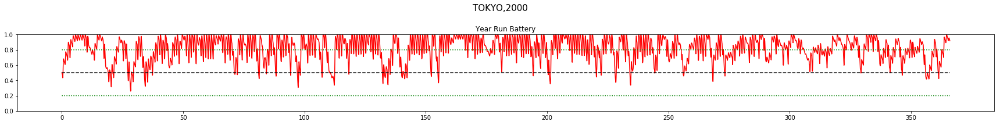

[0.12439024390243902, 0.12439024390243902, 0.12439024390243902, 0.12439024390243902, 0.12439024390243902, 0.12439024390243902, 0.12439024390243902, 0.12439024390243902, 0.12439024390243902, 0.12439024390243902]
[0.14761904761904762, 0.14761904761904762, 0.14761904761904762, 0.14761904761904762, 0.14761904761904762, 0.14761904761904762, 0.14761904761904762, 0.14761904761904762, 0.14761904761904762, 0.14761904761904762]
[0.1697674418604651, 0.1697674418604651, 0.1697674418604651, 0.1697674418604651, 0.1697674418604651, 0.1697674418604651, 0.1697674418604651, 0.1697674418604651, 0.1697674418604651, 0.1697674418604651]
[0.19090909090909092, 0.19090909090909092, 0.19090909090909092, 0.19090909090909092, 0.19090909090909092, 0.19090909090909092, 0.19090909090909092, 0.19090909090909092, 0.19090909090909092, 0.19090909090909092]
[0.2111111111111111, 0.2111111111111111, 0.2111111111111111, 0.2111111111111111, 0.2111111111111111, 0.2111111111111111, 0.2111111111111111, 0.2111111111111111, 0.211

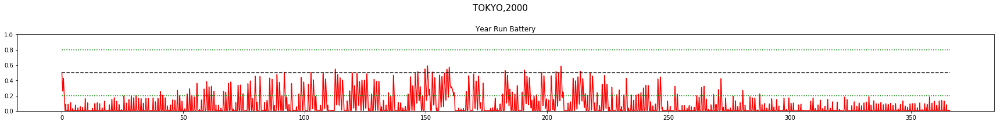

[0.26666666666666666, 0.26666666666666666, 0.26666666666666666, 0.26666666666666666, 0.26666666666666666, 0.26666666666666666, 0.26666666666666666, 0.26666666666666666, 0.26666666666666666, 0.26666666666666666]
[0.2836734693877551, 0.2836734693877551, 0.2836734693877551, 0.2836734693877551, 0.2836734693877551, 0.2836734693877551, 0.2836734693877551, 0.2836734693877551, 0.2836734693877551, 0.2836734693877551]
[0.30000000000000004, 0.30000000000000004, 0.30000000000000004, 0.30000000000000004, 0.30000000000000004, 0.30000000000000004, 0.30000000000000004, 0.30000000000000004, 0.30000000000000004, 0.30000000000000004]
[0.3156862745098039, 0.3156862745098039, 0.3156862745098039, 0.3156862745098039, 0.3156862745098039, 0.3156862745098039, 0.3156862745098039, 0.3156862745098039, 0.3156862745098039, 0.3156862745098039]
[0.3307692307692308, 0.3307692307692308, 0.3307692307692308, 0.3307692307692308, 0.3307692307692308, 0.3307692307692308, 0.3307692307692308, 0.3307692307692308, 0.3307692307692

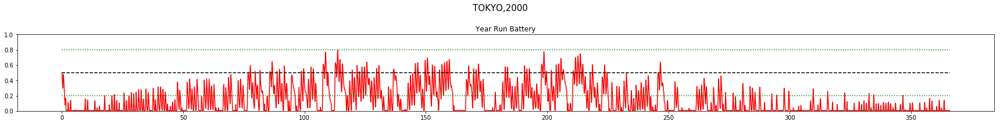

[0.3727272727272727, 0.3727272727272727, 0.3727272727272727, 0.3727272727272727, 0.3727272727272727, 0.3727272727272727, 0.3727272727272727, 0.3727272727272727, 0.3727272727272727, 0.3727272727272727]
[0.3857142857142857, 0.3857142857142857, 0.3857142857142857, 0.3857142857142857, 0.3857142857142857, 0.3857142857142857, 0.3857142857142857, 0.3857142857142857, 0.3857142857142857, 0.3857142857142857]
[0.39824561403508774, 0.39824561403508774, 0.39824561403508774, 0.39824561403508774, 0.39824561403508774, 0.39824561403508774, 0.39824561403508774, 0.39824561403508774, 0.39824561403508774, 0.39824561403508774]
[0.41034482758620694, 0.41034482758620694, 0.41034482758620694, 0.41034482758620694, 0.41034482758620694, 0.41034482758620694, 0.41034482758620694, 0.41034482758620694, 0.41034482758620694, 0.41034482758620694]
[0.42203389830508475, 0.42203389830508475, 0.42203389830508475, 0.42203389830508475, 0.42203389830508475, 0.42203389830508475, 0.42203389830508475, 0.42203389830508475, 0.42203

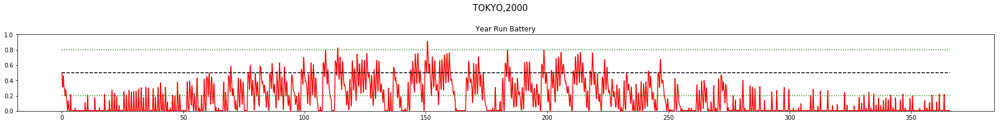

[0.45483870967741935, 0.45483870967741935, 0.45483870967741935, 0.45483870967741935, 0.45483870967741935, 0.45483870967741935, 0.45483870967741935, 0.45483870967741935, 0.45483870967741935, 0.45483870967741935]
[0.4650793650793651, 0.4650793650793651, 0.4650793650793651, 0.4650793650793651, 0.4650793650793651, 0.4650793650793651, 0.4650793650793651, 0.4650793650793651, 0.4650793650793651, 0.4650793650793651]
[0.475, 0.475, 0.475, 0.475, 0.475, 0.475, 0.475, 0.475, 0.475, 0.475]
LOSS : 0.051
[0.48461538461538467, 0.48461538461538467, 0.48461538461538467, 0.48461538461538467, 0.48461538461538467, 0.48461538461538467, 0.48461538461538467, 0.48461538461538467, 0.48461538461538467, 0.48461538461538467]
[0.4939393939393939, 0.4939393939393939, 0.4939393939393939, 0.4939393939393939, 0.4939393939393939, 0.4939393939393939, 0.4939393939393939, 0.4939393939393939, 0.4939393939393939, 0.4939393939393939]
[0.4939393939393939, 0.4939393939393939, 0.4939393939393939, 0.4939393939393939, 0.493939393

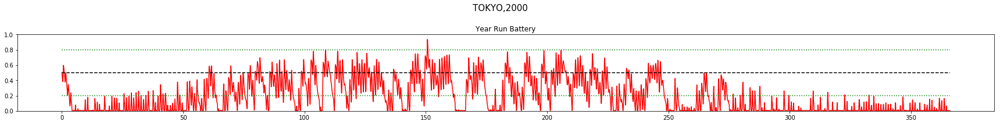

[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.55, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.505, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
DAY: 35

CHECKING... 


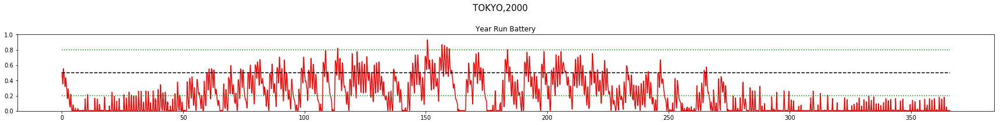

[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
LOSS : 0.045
[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.55, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.505, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
DAY: 42

CHECKING... 


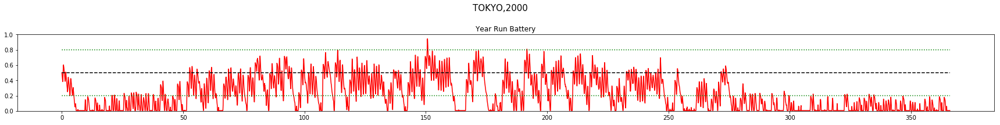

[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.55, 0.55, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
LOSS : 0.053
[0.5950000000000001, 0.5950000000000001, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
DAY: 49

CHECKING... 


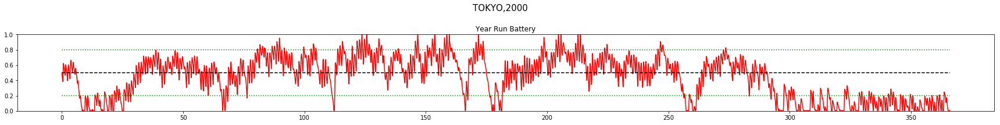

[0.5545000000000001, 0.5545000000000001, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.5099500000000001, 0.5099500000000001, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.55, 0.55, 0.55, 0.55, 0.55, 0.5, 0.55, 0.5, 0.5, 0.5]
[0.5950000000000001, 0.5950000000000001, 0.5950000000000001, 0.5950000000000001, 0.505, 0.5, 0.5950000000000001, 0.5, 0.5, 0.5]
[0.6355000000000001, 0.6355000000000001, 0.6355000000000001, 0.6355000000000001, 0.5, 0.5, 0.5545000000000001, 0.5, 0.5, 0.5]
[0.67195, 0.67195, 0.67195, 0.67195, 0.55, 0.5, 0.5099500000000001, 0.5, 0.5, 0.5]
DAY: 56

CHECKING... 


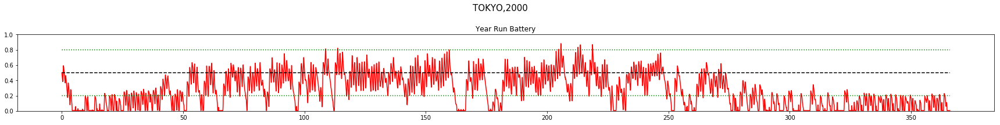

[0.704755, 0.704755, 0.704755, 0.704755, 0.505, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.7342795, 0.7342795, 0.7342795, 0.7342795, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.7608515499999999, 0.7608515499999999, 0.7608515499999999, 0.7608515499999999, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
[0.7847663949999999, 0.7847663949999999, 0.7847663949999999, 0.7847663949999999, 0.55, 0.55, 0.55, 0.5, 0.55, 0.5]
LOSS : 0.081
[0.8062897554999999, 0.8062897554999999, 0.8062897554999999, 0.8062897554999999, 0.5950000000000001, 0.5950000000000001, 0.5950000000000001, 0.5, 0.505, 0.5]
[0.82566077995, 0.82566077995, 0.82566077995, 0.82566077995, 0.6355000000000001, 0.6355000000000001, 0.6355000000000001, 0.5, 0.5, 0.5]
[0.843094701955, 0.843094701955, 0.843094701955, 0.843094701955, 0.67195, 0.67195, 0.67195, 0.5, 0.5, 0.5]
DAY: 63

CHECKING... 


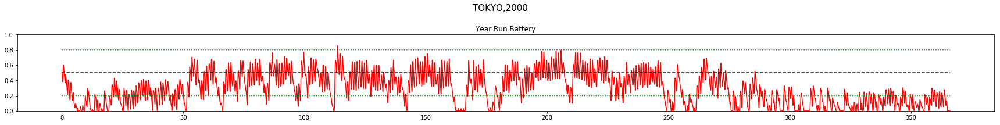

[0.8587852317595001, 0.8587852317595001, 0.8587852317595001, 0.8587852317595001, 0.704755, 0.6391450000000001, 0.6391450000000001, 0.5, 0.5, 0.5]
[0.8446637549354501, 0.8446637549354501, 0.8446637549354501, 0.8446637549354501, 0.6752305000000001, 0.6030595000000001, 0.6030595000000001, 0.5, 0.5, 0.5]
[0.8291301304289951, 0.8291301304289951, 0.8291301304289951, 0.8291301304289951, 0.6427535500000001, 0.56336545, 0.56336545, 0.5, 0.5, 0.5]
[0.8120431434718945, 0.8120431434718945, 0.8120431434718945, 0.8120431434718945, 0.6070289050000002, 0.519701995, 0.519701995, 0.5, 0.5, 0.5]
[0.8308388291247051, 0.8308388291247051, 0.8308388291247051, 0.8308388291247051, 0.6463260145000002, 0.5677317955000001, 0.5, 0.5, 0.5, 0.5]
[0.8477549462122346, 0.8477549462122346, 0.8477549462122346, 0.8477549462122346, 0.6816934130500001, 0.6109586159500001, 0.55, 0.5, 0.5, 0.5]
[0.8629794515910111, 0.8629794515910111, 0.8629794515910111, 0.8629794515910111, 0.7135240717450001, 0.6498627543550001, 0.5950000000

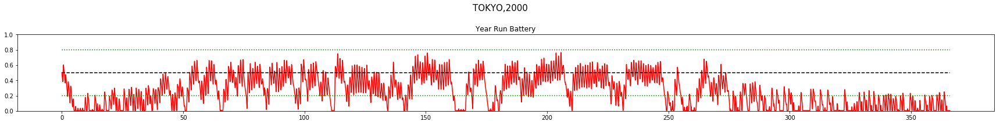

[0.87668150643191, 0.87668150643191, 0.87668150643191, 0.87668150643191, 0.7421716645705001, 0.6848764789195001, 0.5545000000000001, 0.5, 0.5, 0.505]
[0.864349657075101, 0.889013355788719, 0.889013355788719, 0.889013355788719, 0.7679544981134501, 0.6533641268114501, 0.5099500000000001, 0.5, 0.5, 0.5]
LOSS : 0.125
[0.8779146913675909, 0.900112020209847, 0.900112020209847, 0.900112020209847, 0.7447499479247951, 0.6187005394925951, 0.5, 0.5, 0.5, 0.5]
[0.8901232222308318, 0.9101008181888623, 0.9101008181888623, 0.9101008181888623, 0.7702749531323156, 0.6568304855433356, 0.5, 0.5, 0.5, 0.5]
[0.9011109000077486, 0.9190907363699761, 0.9190907363699761, 0.9190907363699761, 0.7932474578190841, 0.691147436989002, 0.5, 0.5, 0.5, 0.5]
[0.9109998100069737, 0.9271816627329784, 0.9271816627329784, 0.9271816627329784, 0.7725722036009925, 0.6602621806879022, 0.5, 0.5, 0.5, 0.5]
[0.9198998290062763, 0.9344634964596805, 0.9344634964596805, 0.9344634964596805, 0.7953149832408933, 0.6262883987566924, 0.55

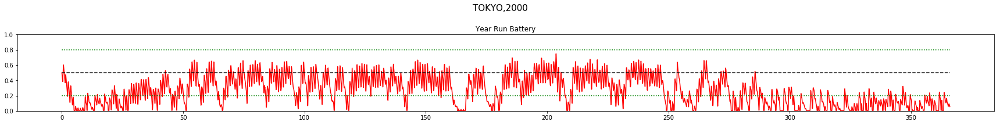

[0.9279098461056486, 0.9410171468137125, 0.9410171468137125, 0.9410171468137125, 0.815783484916804, 0.6636595588810231, 0.5950000000000001, 0.55, 0.55, 0.55]
[0.9351188614950838, 0.9469154321323413, 0.9469154321323413, 0.9469154321323413, 0.8342051364251236, 0.6972936029929209, 0.6355000000000001, 0.5950000000000001, 0.5950000000000001, 0.505]
[0.9416069753455755, 0.9522238889191071, 0.9522238889191071, 0.9522238889191071, 0.8507846227826112, 0.7275642426936287, 0.67195, 0.6355000000000001, 0.6355000000000001, 0.5545]
[0.947446277811018, 0.9570015000271964, 0.9570015000271964, 0.9570015000271964, 0.8657061605043501, 0.7548078184242659, 0.704755, 0.67195, 0.67195, 0.59905]
[0.9527016500299161, 0.9613013500244768, 0.9613013500244768, 0.9613013500244768, 0.8791355444539151, 0.7793270365818393, 0.7342795, 0.704755, 0.704755, 0.558955]
[0.9574314850269245, 0.9651712150220291, 0.9651712150220291, 0.9651712150220291, 0.8912219900085235, 0.8013943329236554, 0.7608515499999999, 0.7342795, 0.734

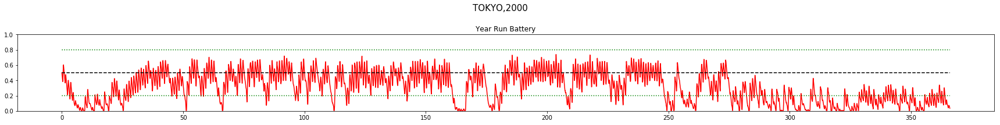

[0.9484920968825786, 0.9655195028718088, 0.9655195028718088, 0.9717886841678435, 0.8683786079103135, 0.759687142837623, 0.7106303755, 0.6784781950000001, 0.6784781950000001, 0.5]
[0.9536428871943208, 0.9689675525846279, 0.9689675525846279, 0.9746098157510591, 0.8815407471192822, 0.7837184285538606, 0.73956733795, 0.7106303755000001, 0.7106303755000001, 0.55]
[0.9582785984748887, 0.9720707973261651, 0.9720707973261651, 0.9771488341759532, 0.893386672407354, 0.8053465856984746, 0.7656106041549999, 0.7395673379500001, 0.7395673379500001, 0.5950000000000001]
[0.9624507386273998, 0.9748637175935486, 0.9748637175935486, 0.9794339507583579, 0.9040480051666187, 0.8248119271286272, 0.7890495437395, 0.765610604155, 0.765610604155, 0.6355000000000001]
[0.9662056647646599, 0.9773773458341938, 0.9773773458341938, 0.9814905556825222, 0.9136432046499567, 0.8423307344157644, 0.81014458936555, 0.7890495437395, 0.7890495437395, 0.67195]
[0.9695850982881938, 0.9796396112507744, 0.9796396112507744, 0.9833

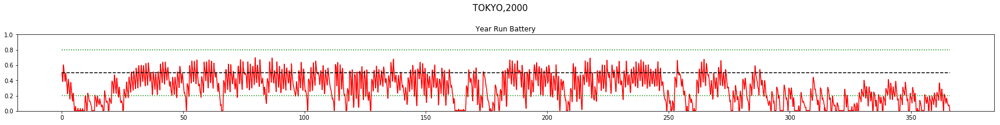

[0.975363929613437, 0.9835080851131273, 0.9835080851131273, 0.9865066150925588, 0.9370458961898185, 0.8850591053890924, 0.8615954056474859, 0.8462171173860955, 0.8462171173860955, 0.7608515499999999]
[0.9778275366520933, 0.9851572766018145, 0.9851572766018145, 0.9878559535833029, 0.9433413065708366, 0.8965531948501831, 0.8754358650827373, 0.8615954056474859, 0.8615954056474859, 0.7847663949999999]
[0.980044782986884, 0.986641548941633, 0.986641548941633, 0.9890703582249726, 0.9490071759137529, 0.9068978753651649, 0.8878922785744636, 0.8754358650827373, 0.8754358650827373, 0.8062897554999999]
[0.9820403046881956, 0.9879773940474698, 0.9879773940474698, 0.99, 0.9541064583223776, 0.9162080878286484, 0.8991030507170172, 0.8878922785744636, 0.8878922785744636, 0.82566077995]
[0.983836274219376, 0.9891796546427227, 0.9891796546427227, 0.99, 0.9586958124901399, 0.9245872790457835, 0.9091927456453155, 0.8991030507170172, 0.8991030507170172, 0.843094701955]
LOSS : 0.259
[0.9854526467974384, 0.9

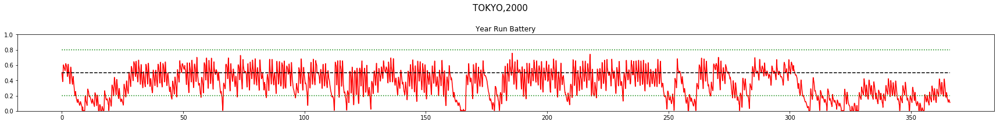

[0.9882166439059251, 0.99, 0.99, 0.99, 0.969889247305312, 0.9450241264243762, 0.933801511575435, 0.9264461239727055, 0.9264461239727055, 0.885616037725195]
[0.9893949795153326, 0.99, 0.99, 0.99, 0.9729003225747808, 0.9505217137819385, 0.9404213604178915, 0.933801511575435, 0.933801511575435, 0.8970544339526756]
[0.99, 0.99, 0.99, 0.99, 0.9756102903173027, 0.9554695424037447, 0.9463792243761023, 0.9404213604178915, 0.9404213604178915, 0.907348990557408]
[0.99, 0.99, 0.99, 0.99, 0.9780492612855725, 0.9599225881633703, 0.9517413019384922, 0.9463792243761023, 0.9463792243761023, 0.9166140915016672]
[0.99, 0.99, 0.99, 0.99, 0.9802443351570153, 0.9639303293470333, 0.9565671717446429, 0.9517413019384922, 0.9517413019384922, 0.9249526823515004]
[0.99, 0.99, 0.99, 0.99, 0.9822199016413138, 0.9675372964123299, 0.9609104545701787, 0.9565671717446429, 0.9565671717446429, 0.9324574141163504]
[0.99, 0.99, 0.99, 0.99, 0.9839979114771824, 0.9707835667710969, 0.9648194091131608, 0.9609104545701787, 0.9

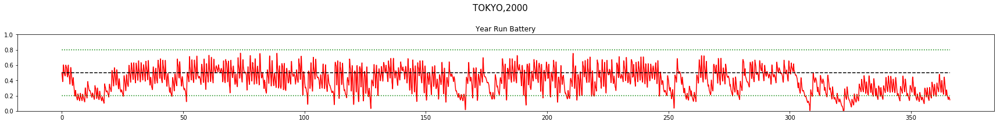

[0.99, 0.99, 0.99, 0.99, 0.9855981203294641, 0.9737052100939873, 0.9683374682018447, 0.9648194091131608, 0.9648194091131608, 0.9452905054342439]
[0.99, 0.99, 0.99, 0.99, 0.9870383082965177, 0.9763346890845885, 0.9715037213816603, 0.9683374682018447, 0.9683374682018447, 0.9507614548908194]
[0.99, 0.99, 0.99, 0.99, 0.988334477466866, 0.9787012201761297, 0.9743533492434943, 0.9715037213816603, 0.9715037213816603, 0.9556853094017375]
LOSS : 0.287
[0.99, 0.99, 0.99, 0.99, 0.9895010297201794, 0.9808310981585168, 0.9769180143191448, 0.9743533492434943, 0.9743533492434943, 0.9601167784615637]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.9827479883426651, 0.9792262128872303, 0.9769180143191448, 0.9769180143191448, 0.9641051006154073]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.9844731895083986, 0.9813035915985073, 0.9792262128872303, 0.9792262128872303, 0.9676945905538666]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.9860258705575587, 0.9831732324386566, 0.9813035915985073, 0.9813035915985073, 0.9709251314984799]
DAY: 112

CHECK

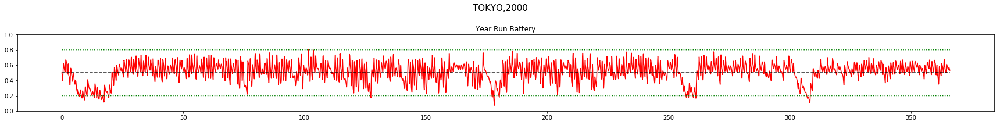

[0.99, 0.99, 0.99, 0.99, 0.99, 0.9874232835018029, 0.9848559091947909, 0.9831732324386566, 0.9831732324386566, 0.9738326183486319]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.9886809551516226, 0.9863703182753119, 0.9848559091947909, 0.9848559091947909, 0.9764493565137687]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.9898128596364604, 0.9877332864477807, 0.9863703182753119, 0.9863703182753119, 0.9788044208623918]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.9889599578030026, 0.9877332864477807, 0.9877332864477807, 0.9809239787761527]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.9889599578030026, 0.9889599578030026, 0.9828315808985374]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.9845484228086836]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.9860935805278153]
DAY: 119

CHECKING... 


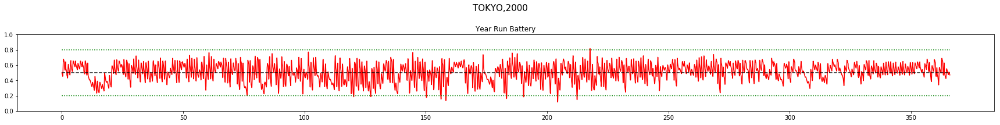

[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.9874842224750338]
LOSS : 0.335
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.9887358002275304]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.9898622202047773]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
DAY: 126

CHECKING... 


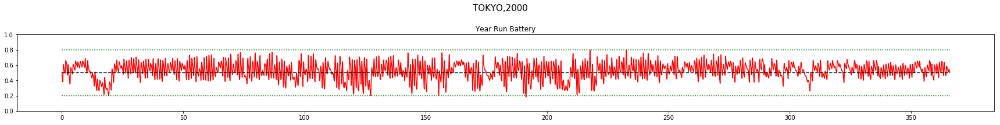

[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
LOSS : 0.374
DAY: 133

CHECKING... 


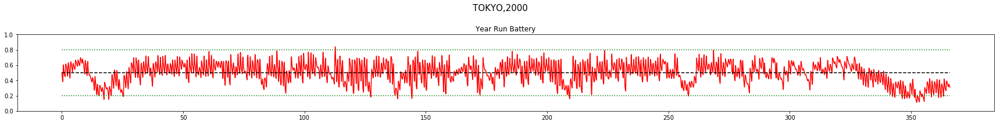

[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
DAY: 140

CHECKING... 


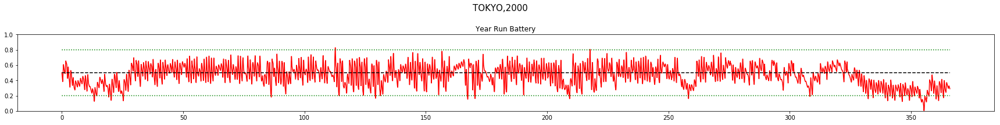

[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
LOSS : 0.419
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
DAY: 147

CHECKING... 


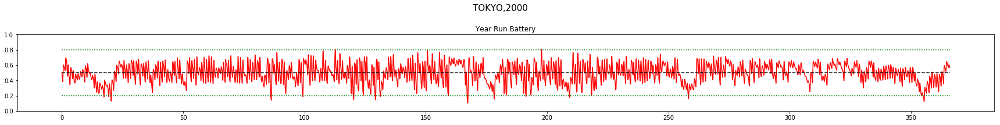

[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
DAY: 154

CHECKING... 


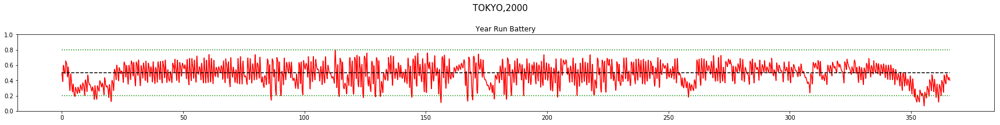

[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
LOSS : 0.469
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
DAY: 161

CHECKING... 


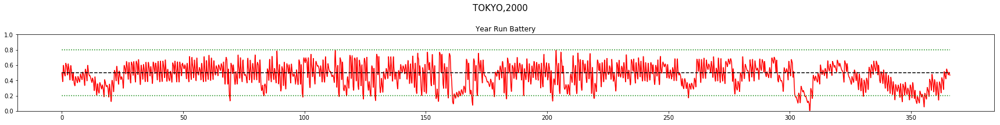

[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.989, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.989]
[0.9879, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.9879]
[0.98669, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.98669]
[0.9880209999999999, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.9880209999999999]
[0.9892188999999999, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.9892188999999999]
DAY: 168

CHECKING... 


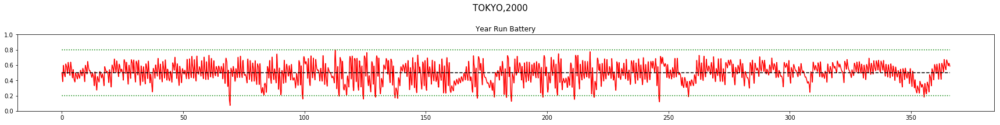

[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
LOSS : 0.525
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.989, 0.99, 0.99, 0.99, 0.99]
DAY: 175

CHECKING... 


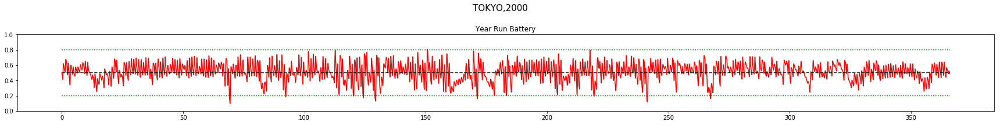

[0.99, 0.99, 0.99, 0.99, 0.99, 0.9879, 0.99, 0.99, 0.99, 0.989]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.98669, 0.99, 0.99, 0.99, 0.9879]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.985359, 0.99, 0.99, 0.99, 0.98669]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.9868231, 0.99, 0.99, 0.99, 0.9880209999999999]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.98814079, 0.99, 0.99, 0.99, 0.9892188999999999]
[0.99, 0.99, 0.99, 0.99, 0.99, 0.989326711, 0.99, 0.99, 0.99, 0.99]
LOSS : 0.595


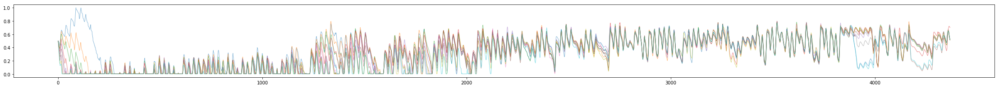

In [25]:
from figplot import figplot

ANNUAL_MEMORY = []
TOTAL_MEMORY = []
adpt_exp = False

yr = 2000
dummy1 = CAPM(LOCATION, yr)
dummy1.eno = ENO(LOCATION, yr)
dummy1.HMAX = dummy1.eno.SMAX
dummy1.reset()
capm_list = [dummy1]*NO_OF_NODES

sc_EPSILON = 0.1
for iteration in range(1):
    print(iteration, sc_EPSILON)
    ANNUAL_MEMORY.clear()

    for cpm in capm_list:
        cpm.eno.day = 0
    print(capm_list[0].year)
    
    for day in range(26*7):
        if adpt_exp == False:
#             print(day, sc_EPSILON)
            A = 40
            sc_EPSILON = np.clip((0.1 + day/(day+A)),0.1,0.99)
            if sc_EPSILON > 0.5:
                adpt_exp = True
        
        day_list = [day]*NO_OF_NODES
        param_list = [MODEL_FILENAME]*NO_OF_NODES
        adpt_exp_list = [adpt_exp]*NO_OF_NODES
        
        if adpt_exp:
            sc_EPSILON_list = [item[2] for item in result]
        else:
            sc_EPSILON_list = [sc_EPSILON]*NO_OF_NODES
        
        print([round(x,2) for x in sc_EPSILON_list])

        arglist = [arg for arg in zip(range(NO_OF_NODES), 
                                      day_list, 
                                      sc_EPSILON_list, 
                                      param_list, 
                                      capm_list,
                                      adpt_exp_list)]
        result = pool.starmap(T_ENO, arglist)

        node_experience  = np.array([item[0] for item in result])
        capm_list = [item[1] for item in result]
        
        ANNUAL_MEMORY.append(node_experience)
        TOTAL_MEMORY.append(node_experience)
        all_exp = np.array([item for each_node_exp in node_experience 
                                    for episode_exp in each_node_exp 
                                        for item in episode_exp]).reshape(-1,10)

        dqn.memory = np.insert(dqn.memory, 0, all_exp , 0)
        dqn.memory = dqn.memory[:MEMORY_CAPACITY,:]
        dqn.memory_counter += all_exp.shape[0]


        if dqn.memory_counter > 24*7:#MEMORY_CAPACITY:
            for nn_iter in range(NN_ITERATIONS):
                dqn.learn()
            # SAVE MODEL
            torch.save(dqn.eval_net.state_dict(), MODEL_FILENAME)
            
        if day%7==0:
            print("DAY:", day)
            print("\nCHECKING... ")
            # CHECKING NN MODEL
            #########################################################################################################################
            LOCATION = 'tokyo'#random.choice(['tokyo','aomori','fukuoka'])
            YEAR = 2000#random.choice(np.arange(2000,2010))

            capm = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
            capm.eno = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
            capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

            s, r, day_end, year_end = capm.reset()
            yr_test_record = np.empty(4)

            while True:
                a = dqn.choose_greedy_action(stdize(s))
                #state = [batt, enp, henergy, fcast]
                yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action

                # take action
                s_, r, day_end, year_end = capm.step(a)

                if year_end:
                    break

                s = s_

            yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
            yr_test_reward_rec = yr_test_record[:,2]
            yr_test_reward_rec = yr_test_reward_rec[::24]

            title = LOCATION.upper() + ',' + str(YEAR)
            NO_OF_DAYS = capm.eno.NO_OF_DAYS

            fig = plt.figure(figsize=(24,3))
            fig.suptitle(title, fontsize=15)
            #Plot the reward and battery for the entire year run
            ax2 = fig.add_subplot(111)
            ax2.plot(yr_test_record[:,0],'r')
            ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
            ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN) /capm.BMAX, 'g:')
            ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN)/capm.BMAX, 'g:')
            ax2.set_title("\n\nYear Run Battery")
            ax2.set_ylim([0,1])
            plt.sca(ax2)
            plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
            fig.tight_layout()
            plt.show()
            ##########################################################################################################################

    AN_NUAL_MEMORY = np.array(ANNUAL_MEMORY)
    MEM = np.einsum('dnes->ndes',AN_NUAL_MEMORY)
    #single file all data
    STATES = MEM[:,:,:,0:N_STATES].reshape(-1,4)
    ACTIONS = MEM[:,:,:,N_STATES:N_STATES+1].reshape(-1,1)
    REWARDS = MEM[:,:,:,N_STATES+1:N_STATES+2].reshape(-1,1)
    #Destandardize state values from memory
    DSTD_STATES = batch_destdize(STATES)
    #NODE_MEMS contains list of (s,a,r) for all hours of all days for each node
    NODE_MEMS = np.column_stack((DSTD_STATES,ACTIONS,REWARDS))
    NODE_MEMS = NODE_MEMS.reshape(NO_OF_NODES,-1,6)

    plt.figure(figsize=(39,3))
    for i in range(NO_OF_NODES):
        plt.plot(NODE_MEMS[i,:,0], alpha=0.5, linewidth=1.0)
    plt.show()


pool.close()
pool.join()
    
    

In [42]:
TOTAL_MEMORY = np.array(TOTAL_MEMORY)

MEM = np.einsum('dnes->ndes',TOTAL_MEMORY)

#single file all data
STATES = MEM[:,:,:,0:N_STATES].reshape(-1,4)
ACTIONS = MEM[:,:,:,N_STATES:N_STATES+1].reshape(-1,1)
REWARDS = MEM[:,:,:,N_STATES+1:N_STATES+2].reshape(-1,1)

In [43]:
#Destandardize state values from memory
DSTD_STATES = batch_destdize(STATES)

In [44]:
#NODE_MEMS contains list of (s,a,r) for all hours of all days for each node
NODE_MEMS = np.column_stack((DSTD_STATES,ACTIONS,REWARDS))
NODE_MEMS = NODE_MEMS.reshape(NO_OF_NODES,-1,6)
np.save('AENO',NODE_MEMS)


In [29]:
# plt.figure(figsize=(24,3))
# plt.plot(node_0[:,0],'r')
# # plt.plot(z[:,1])
# plt.plot(node_0[:,2],'c',alpha=0.4)
# # plt.plot(node_0[:,3],'b')
# plt.plot(node_0[:,4]/9,'b')
# # plt.plot(node_0[:,5],'k--')
# plt.minorticks_on()

# plt.grid(which='both',axis='x')

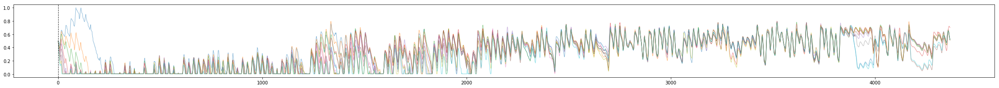

In [30]:
plt.figure(figsize=(39,3))
for i in range(NO_OF_NODES):
    plt.plot(NODE_MEMS[i,:,0], alpha=0.5, linewidth=1.0)
for i in range(iteration+1):
    plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.8)



In [31]:
batt = NODE_MEMS[:,:,0]

In [32]:
downtime_occur = (batt < 0.006).astype(int)
overflow_occur = (batt == 1).astype(int)

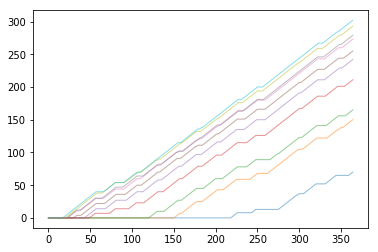

In [33]:
#DOWNTIME PER NODE WITH TIME
for i in range(NO_OF_NODES):
    plt.plot(downtime_occur[i,0:365].cumsum(), alpha=0.5, linewidth=1.0)

# for i in range(iteration+1):
#     plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

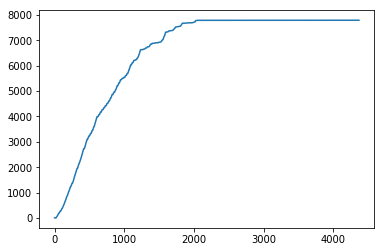

In [34]:
# OVERALL DOWNTIME OF SYSTEM

total_downtime = downtime_occur.sum(axis=0)
plt.plot(total_downtime.cumsum())

# for i in range(iteration+1):
#     plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

<BarContainer object of 10 artists>

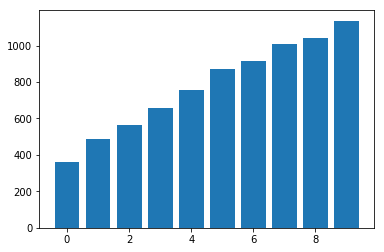

In [35]:
# TOTAL DOWNTIME PER NODE

total_downtime = downtime_occur.sum(axis = 1)
plt.bar(range(NO_OF_NODES),height = total_downtime)

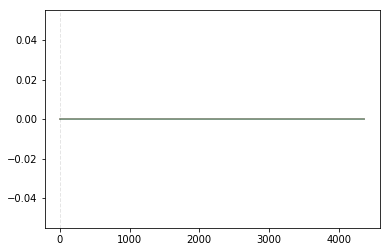

In [36]:
#OVERFLOW PER NODE WITH TIME

for i in range(NO_OF_NODES):
    plt.plot(overflow_occur[i,:].cumsum(), alpha=0.5, linewidth=1.0)
    
for i in range(iteration+1):
    plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

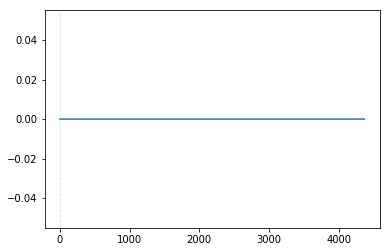

In [37]:
# OVERALL OVERFLOW OF SYSTEM

total_overflow = overflow_occur.sum(axis=0)
plt.plot(total_overflow.cumsum())

for i in range(iteration+1):
    plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

<BarContainer object of 10 artists>

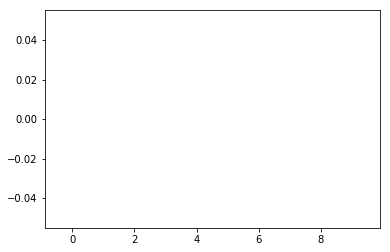

In [38]:
# TOTAL OVERFLOW  PER NODE

total_overflow = overflow_occur.sum(axis = 1)
plt.bar(range(NO_OF_NODES),height = total_overflow)

In [39]:
S_FILENAME = MODEL_FILENAME
print("Loading MODEL from FILE: ", S_FILENAME)
dqn = DQN()
dqn.eval_net.load_state_dict(torch.load(S_FILENAME))
dqn.eval_net.eval()
print("DEVICE: ", dqn.device)

Loading MODEL from FILE:  ./models/DENOSTI6WR1Z__18_38_07__161.pt
DEVICE:  cpu


***MEASURING PERFORMANCE OF THE MODEL***


************************************
Day Violations           =     27
Battery Limit Violations =    221
Battery FULL Violations  =      0
Battery EMPTY Violations =    221


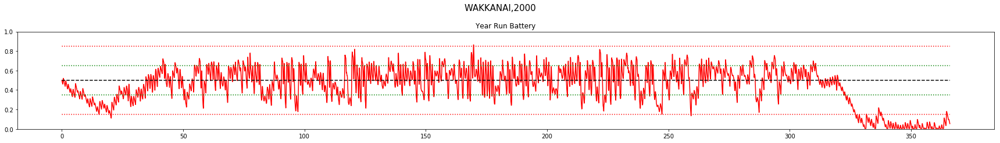



************************************
Day Violations           =     25
Battery Limit Violations =    277
Battery FULL Violations  =      0
Battery EMPTY Violations =    277


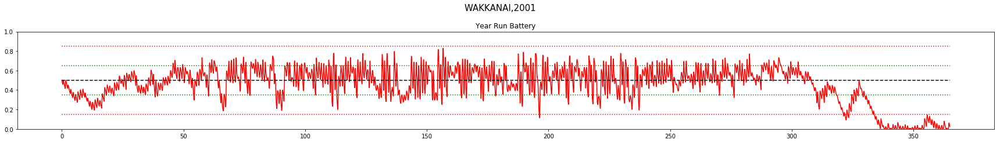



************************************
Day Violations           =     34
Battery Limit Violations =    318
Battery FULL Violations  =      0
Battery EMPTY Violations =    318


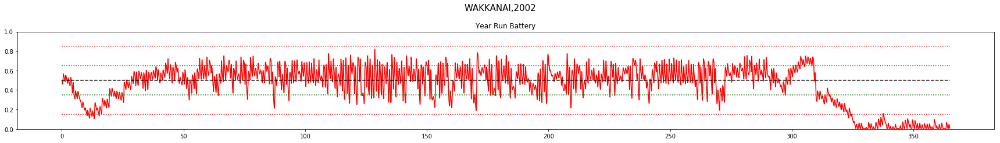



************************************
Day Violations           =     21
Battery Limit Violations =    197
Battery FULL Violations  =      0
Battery EMPTY Violations =    197


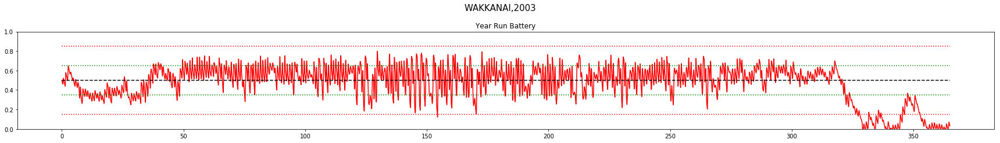



************************************
Day Violations           =     22
Battery Limit Violations =    267
Battery FULL Violations  =      0
Battery EMPTY Violations =    267


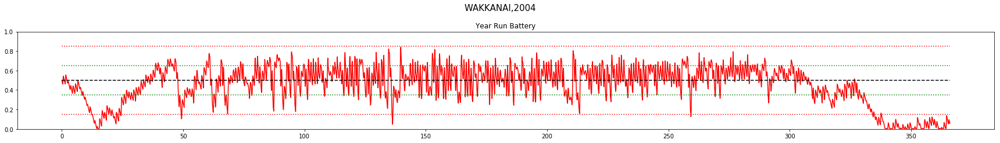



************************************
Day Violations           =     13
Battery Limit Violations =     76
Battery FULL Violations  =      0
Battery EMPTY Violations =     76


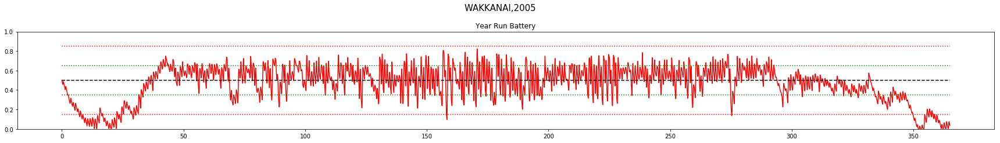



************************************
Day Violations           =     22
Battery Limit Violations =    214
Battery FULL Violations  =      0
Battery EMPTY Violations =    214


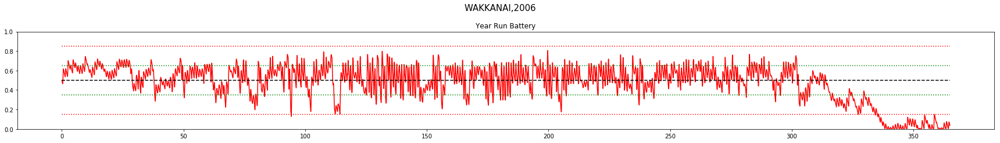



************************************
Day Violations           =     21
Battery Limit Violations =    199
Battery FULL Violations  =      0
Battery EMPTY Violations =    199


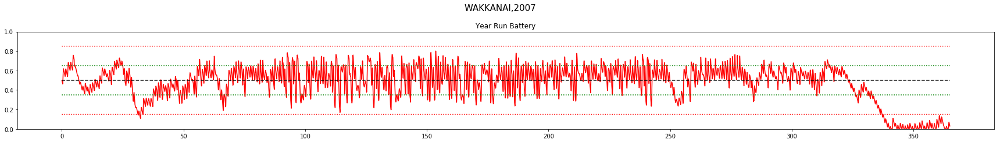



************************************
Day Violations           =     18
Battery Limit Violations =    170
Battery FULL Violations  =      0
Battery EMPTY Violations =    170


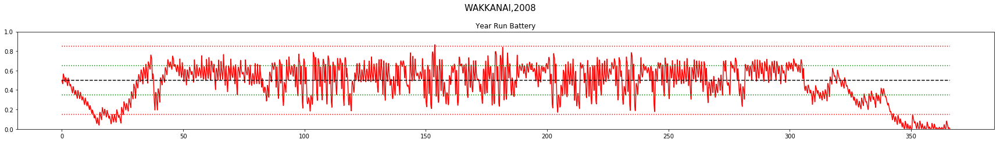



************************************
Day Violations           =     22
Battery Limit Violations =    146
Battery FULL Violations  =      0
Battery EMPTY Violations =    146


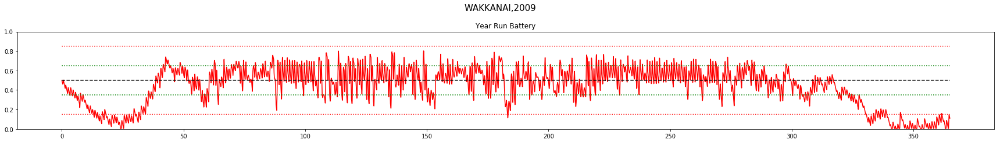



************************************
Day Violations           =     15
Battery Limit Violations =    180
Battery FULL Violations  =      0
Battery EMPTY Violations =    180


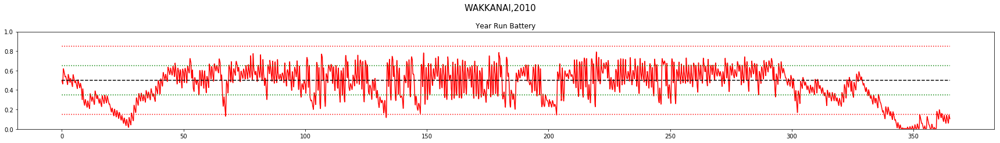



************************************
Day Violations           =     30
Battery Limit Violations =    268
Battery FULL Violations  =      0
Battery EMPTY Violations =    268


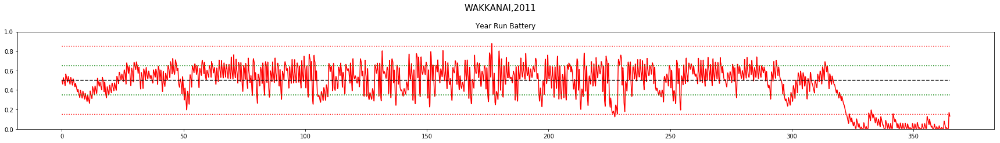



************************************
Day Violations           =     36
Battery Limit Violations =    379
Battery FULL Violations  =      0
Battery EMPTY Violations =    379


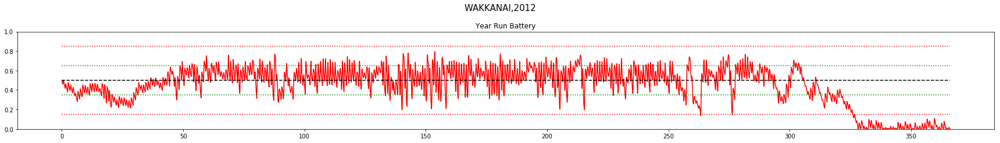



************************************
Day Violations           =     20
Battery Limit Violations =    205
Battery FULL Violations  =      0
Battery EMPTY Violations =    205


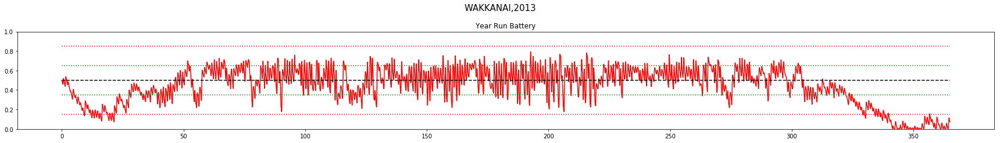



************************************
Day Violations           =     19
Battery Limit Violations =    145
Battery FULL Violations  =      0
Battery EMPTY Violations =    145


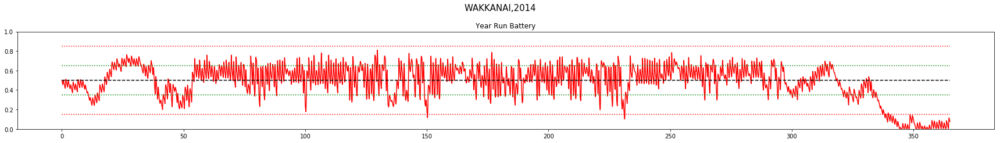



************************************
Day Violations           =     15
Battery Limit Violations =    125
Battery FULL Violations  =      0
Battery EMPTY Violations =    125


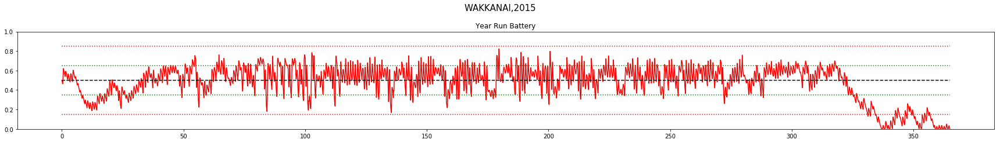



************************************
Day Violations           =     40
Battery Limit Violations =    291
Battery FULL Violations  =      0
Battery EMPTY Violations =    291


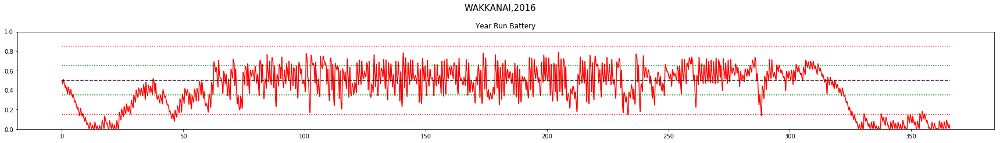



************************************
Day Violations           =     34
Battery Limit Violations =    291
Battery FULL Violations  =      0
Battery EMPTY Violations =    291


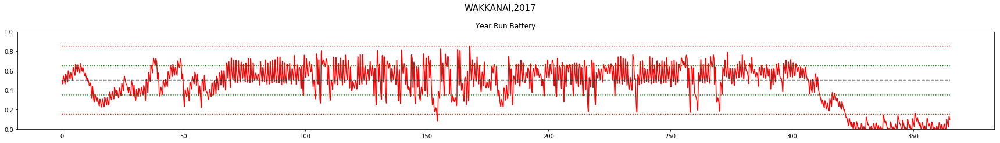



************************************
Day Violations           =     23
Battery Limit Violations =    235
Battery FULL Violations  =      0
Battery EMPTY Violations =    235


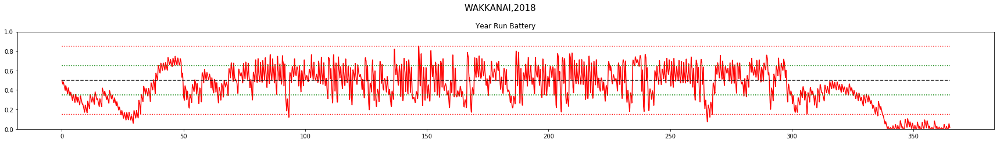



WAKKANAI
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.76		27	 221	221	0
2001	 0.8		25	 277	277	0
2002	 0.75		34	 318	318	0
2003	 0.83		21	 197	197	0
2004	 0.77		22	 267	267	0
2005	 0.82		13	 76	76	0
2006	 0.82		22	 214	214	0
2007	 0.83		21	 199	199	0
2008	 0.8		18	 170	170	0
2009	 0.73		22	 146	146	0
2010	 0.79		15	 180	180	0
2011	 0.78		30	 268	268	0
2012	 0.76		36	 379	379	0
2013	 0.78		20	 205	205	0
2014	 0.84		19	 145	145	0
2015	 0.84		15	 125	125	0
2016	 0.67		40	 291	291	0
2017	 0.75		34	 291	291	0
2018	 0.77		23	 235	235	0

TOTAL Day  Violations:   457.0
TOTAL Batt  Violations:  4204.0
TOTAL EMPTY Violations:  4204.0
TOTAL FULL  Violations:  0.0
************************************


************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


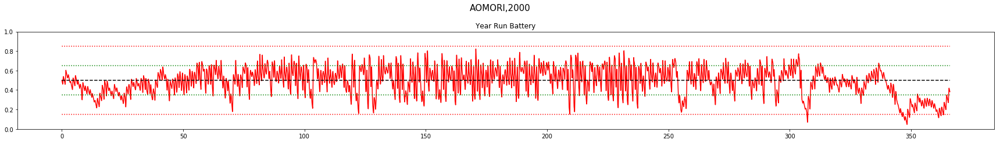



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


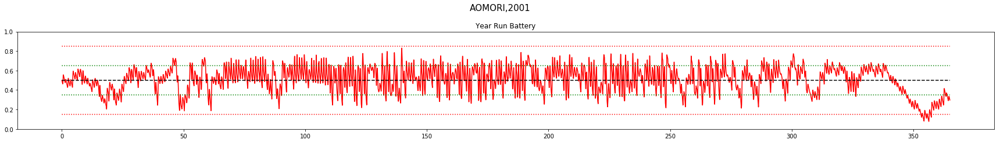



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


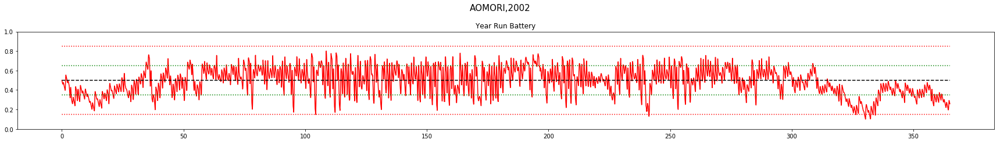



************************************
Day Violations           =      6
Battery Limit Violations =     49
Battery FULL Violations  =      0
Battery EMPTY Violations =     49


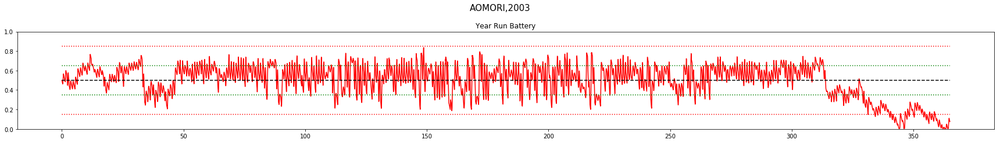



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


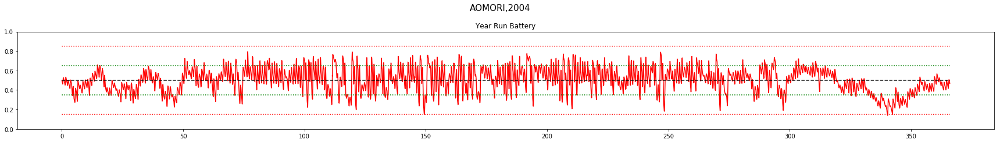



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


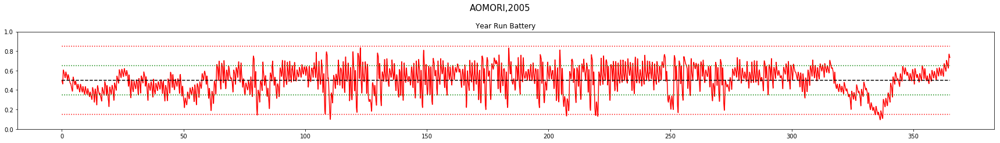



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


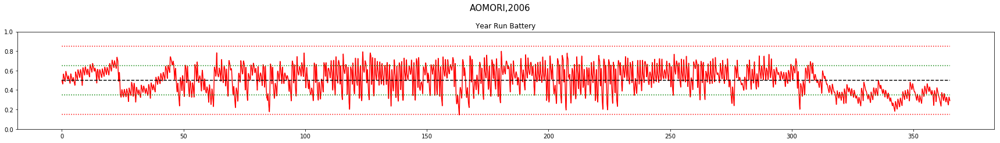



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


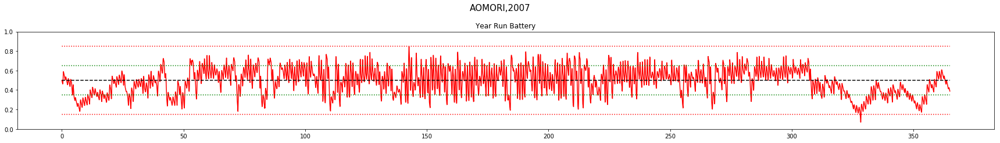



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


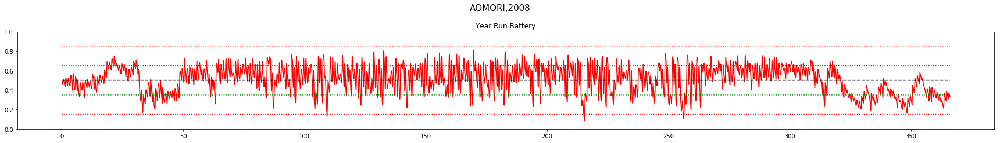



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


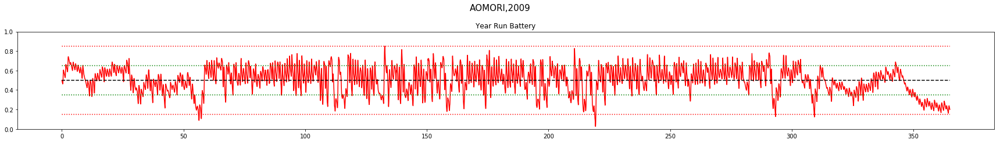



************************************
Day Violations           =      2
Battery Limit Violations =     11
Battery FULL Violations  =      0
Battery EMPTY Violations =     11


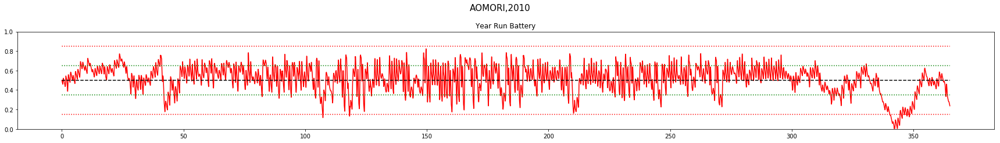



************************************
Day Violations           =      2
Battery Limit Violations =      6
Battery FULL Violations  =      0
Battery EMPTY Violations =      6


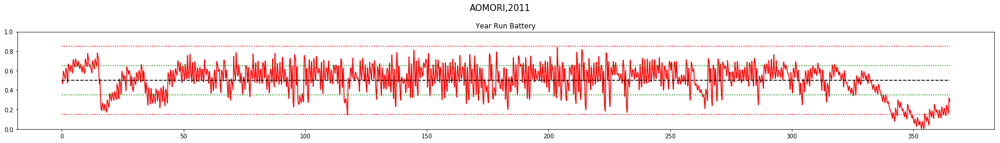



************************************
Day Violations           =      2
Battery Limit Violations =     12
Battery FULL Violations  =      0
Battery EMPTY Violations =     12


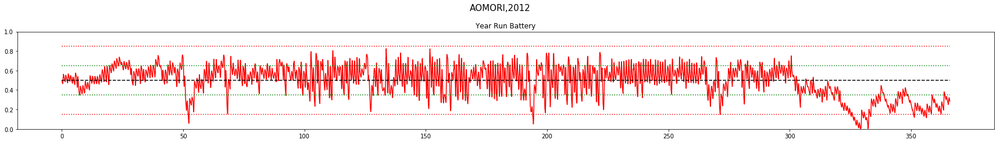



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


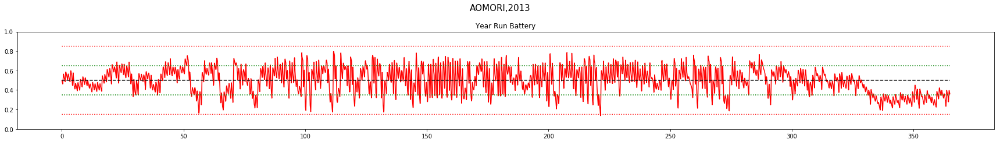



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


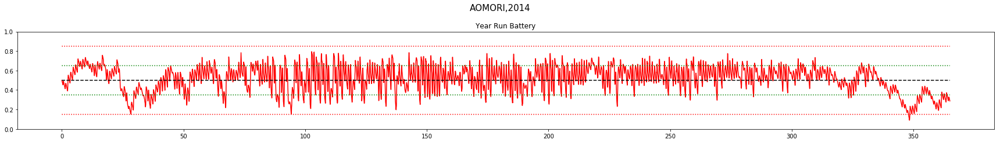



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


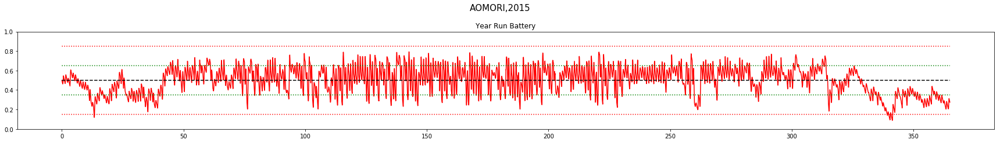



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


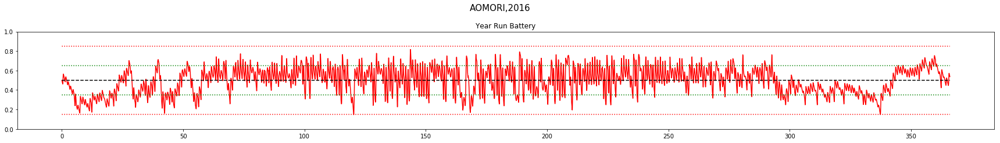



************************************
Day Violations           =      2
Battery Limit Violations =     13
Battery FULL Violations  =      0
Battery EMPTY Violations =     13


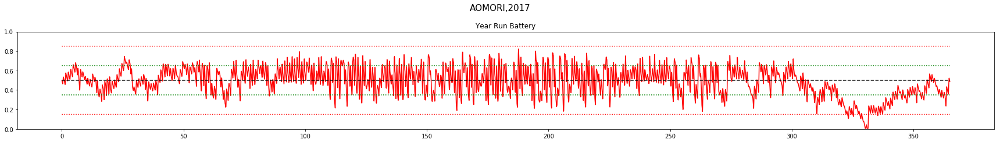



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


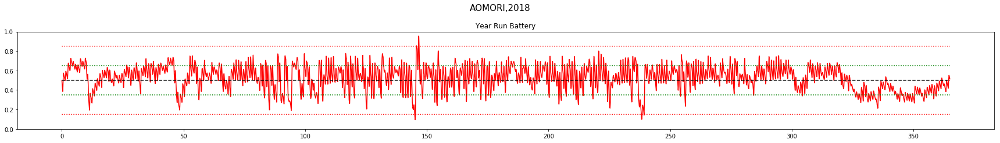



AOMORI
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.93		0	 0	0	0
2001	 0.95		0	 0	0	0
2002	 0.95		0	 0	0	0
2003	 0.88		6	 49	49	0
2004	 0.97		0	 0	0	0
2005	 0.96		0	 0	0	0
2006	 0.99		0	 0	0	0
2007	 0.96		0	 0	0	0
2008	 0.96		0	 0	0	0
2009	 0.95		0	 0	0	0
2010	 0.93		2	 11	11	0
2011	 0.9		2	 6	6	0
2012	 0.89		2	 12	12	0
2013	 0.97		0	 0	0	0
2014	 0.96		0	 0	0	0
2015	 0.96		0	 0	0	0
2016	 0.96		0	 0	0	0
2017	 0.93		2	 13	13	0
2018	 0.98		0	 0	0	0

TOTAL Day  Violations:   14.0
TOTAL Batt  Violations:  91.0
TOTAL EMPTY Violations:  91.0
TOTAL FULL  Violations:  0.0
************************************


************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


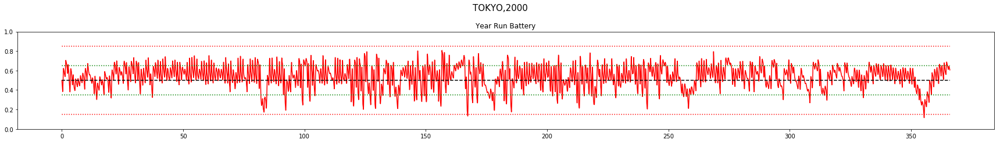



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


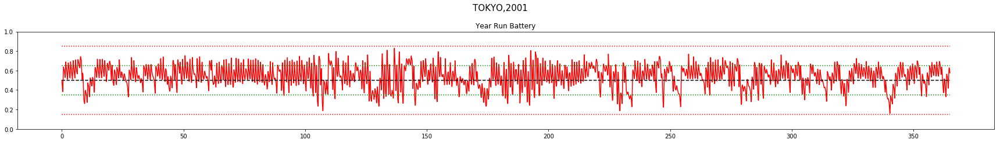



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


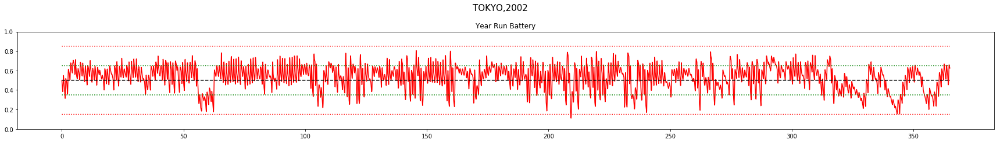



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


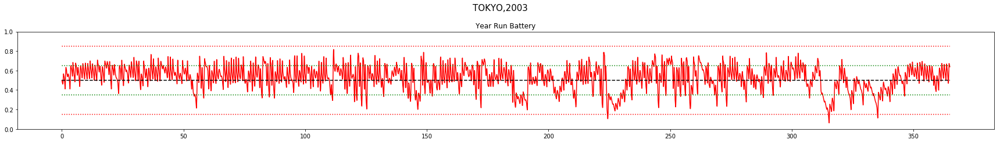



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


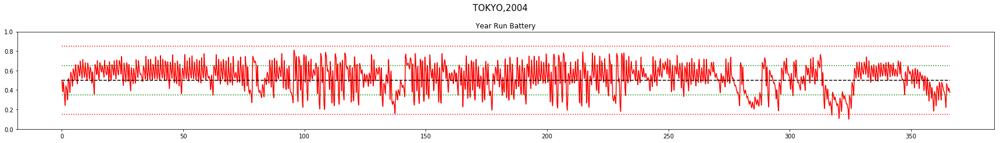



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


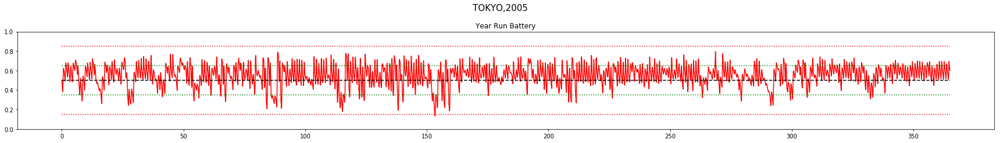



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


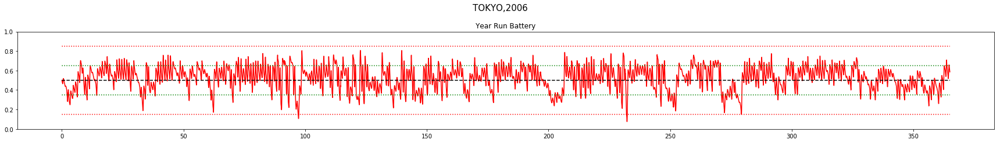



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


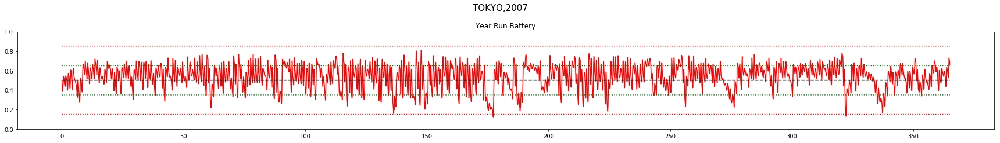



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


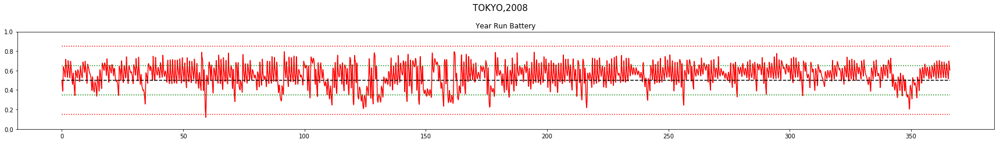



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


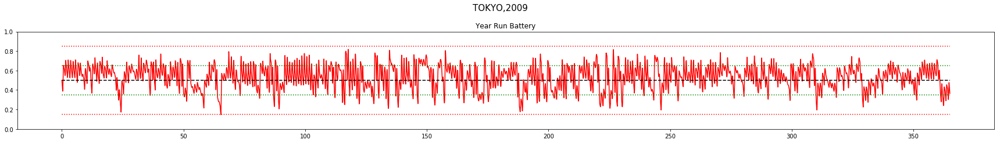



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


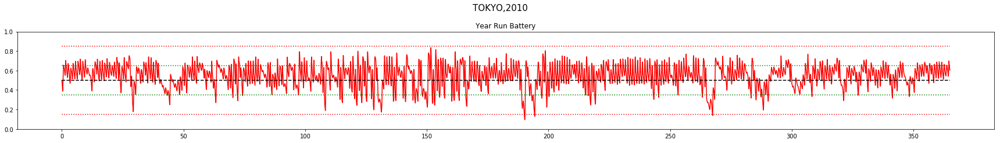



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


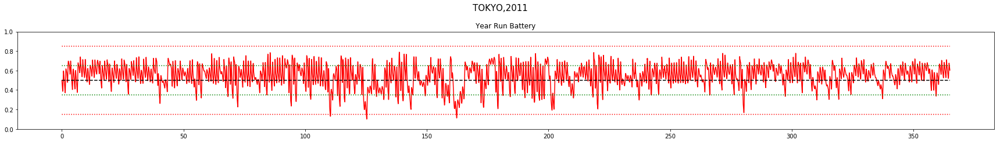



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


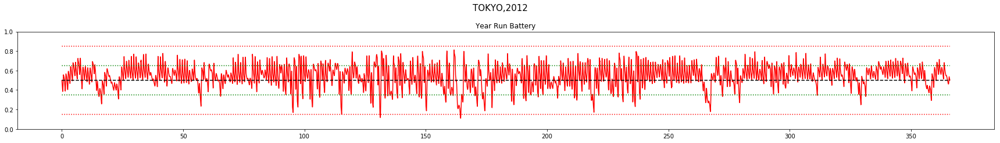



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


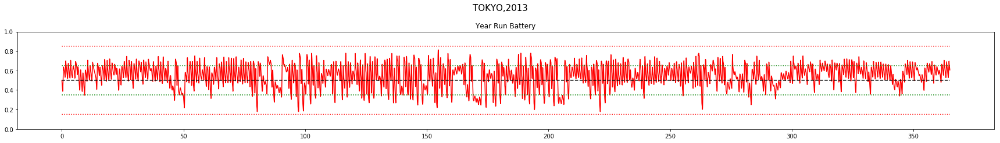



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


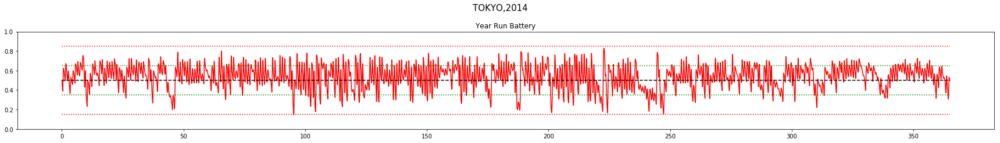



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


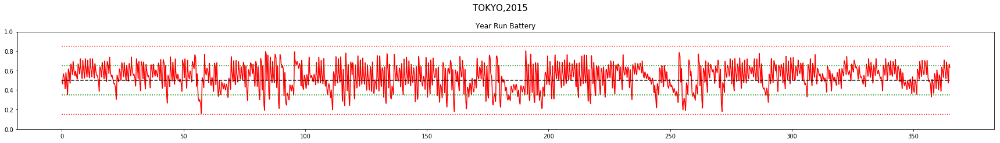



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


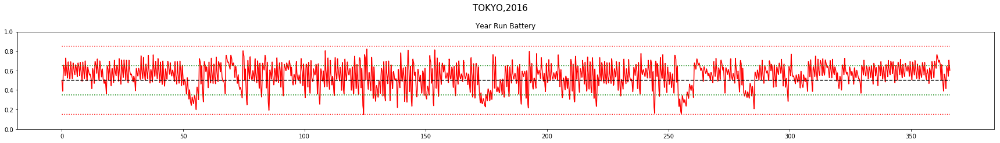



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


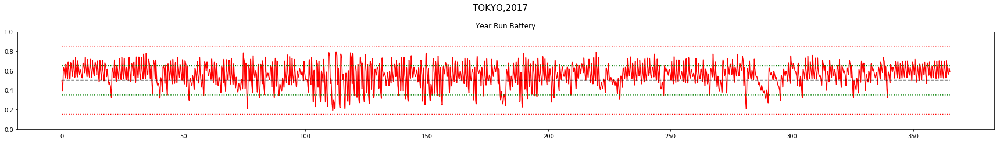



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


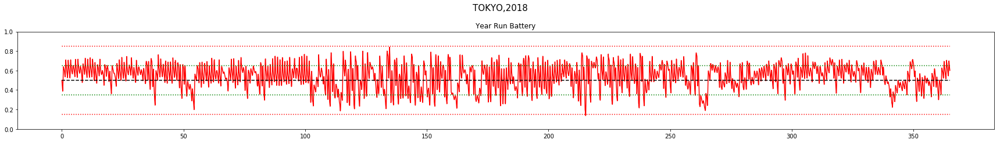



TOKYO
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.99		0	 0	0	0
2001	 0.99		0	 0	0	0
2002	 0.98		0	 0	0	0
2003	 0.97		0	 0	0	0
2004	 0.97		0	 0	0	0
2005	 0.99		0	 0	0	0
2006	 0.99		0	 0	0	0
2007	 0.98		0	 0	0	0
2008	 0.99		0	 0	0	0
2009	 0.99		0	 0	0	0
2010	 0.99		0	 0	0	0
2011	 0.98		0	 0	0	0
2012	 0.99		0	 0	0	0
2013	 0.99		0	 0	0	0
2014	 0.99		0	 0	0	0
2015	 0.99		0	 0	0	0
2016	 0.99		0	 0	0	0
2017	 1.0		0	 0	0	0
2018	 0.99		0	 0	0	0

TOTAL Day  Violations:   0.0
TOTAL Batt  Violations:  0.0
TOTAL EMPTY Violations:  0.0
TOTAL FULL  Violations:  0.0
************************************


************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


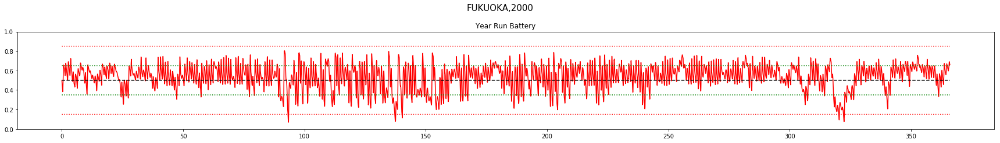



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


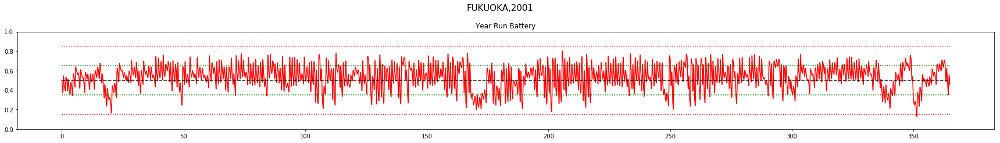



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


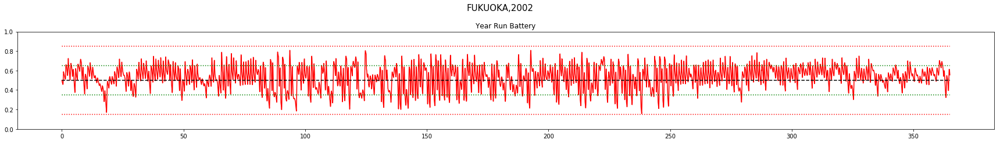



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


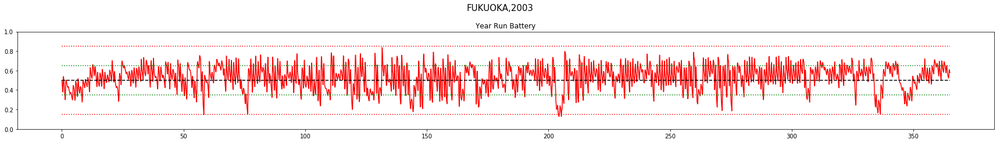



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


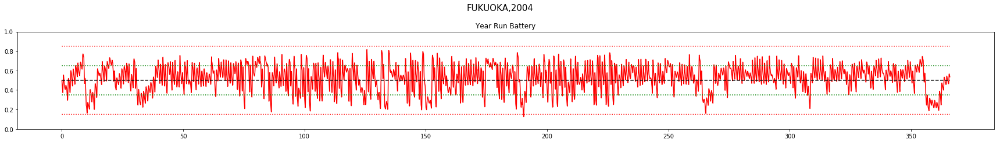



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


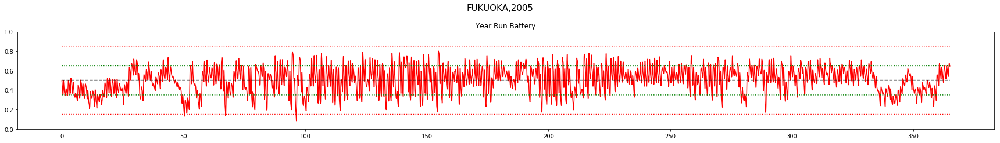



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


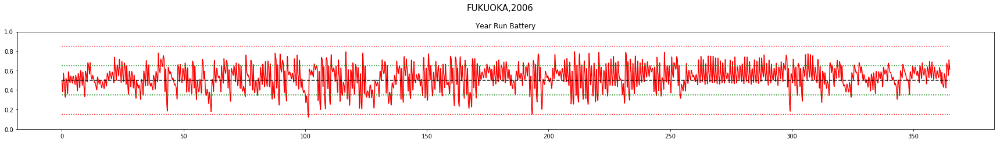



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


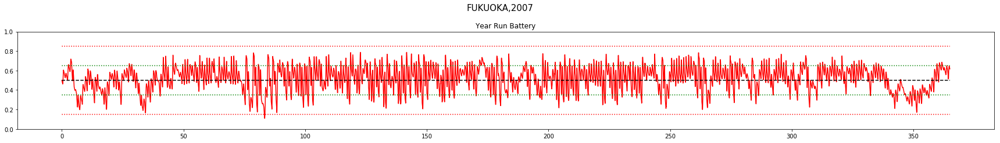



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


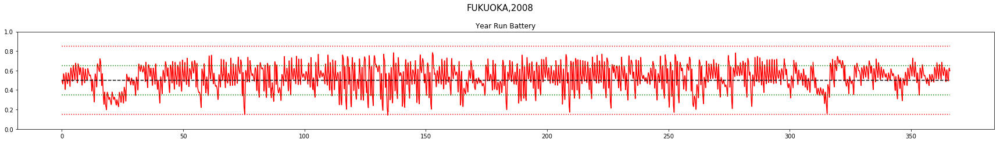



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


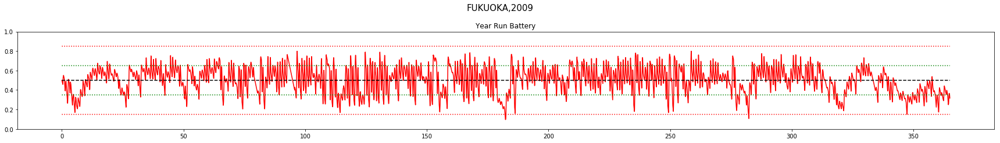



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


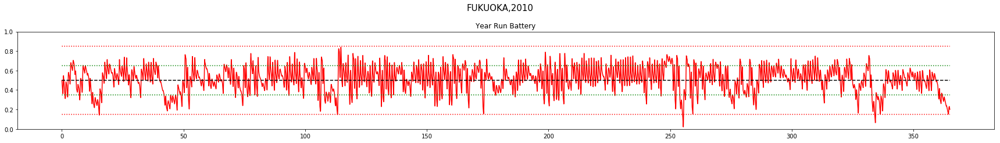



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


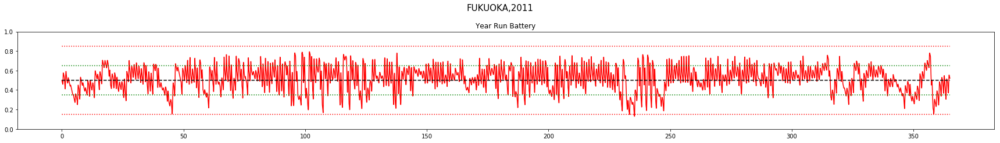



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


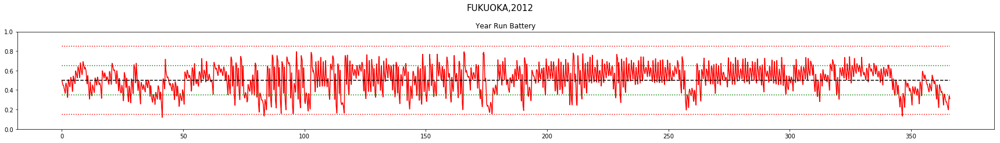



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


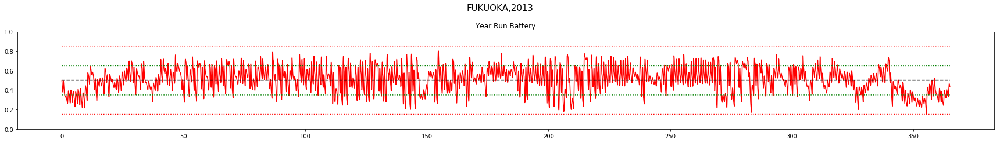



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


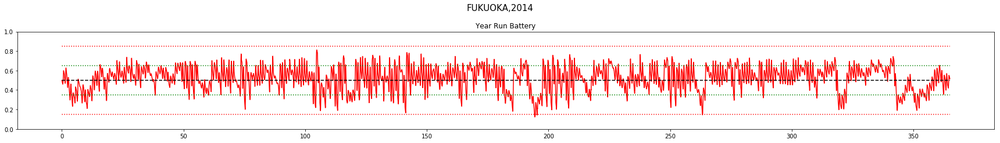



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


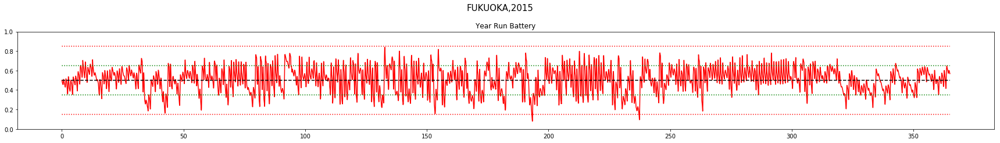



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


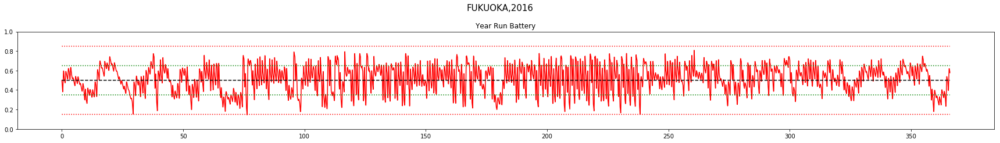



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


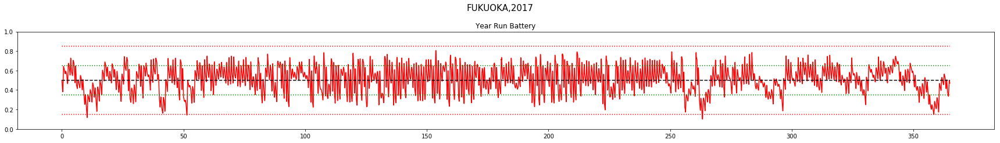



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


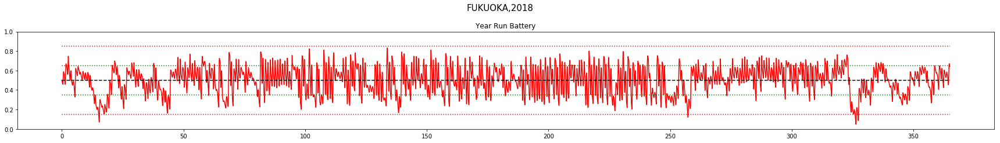



FUKUOKA
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.98		0	 0	0	0
2001	 0.99		0	 0	0	0
2002	 1.0		0	 0	0	0
2003	 0.98		0	 0	0	0
2004	 0.97		0	 0	0	0
2005	 0.99		0	 0	0	0
2006	 1.0		0	 0	0	0
2007	 0.98		0	 0	0	0
2008	 0.99		0	 0	0	0
2009	 0.97		0	 0	0	0
2010	 0.97		0	 0	0	0
2011	 0.98		0	 0	0	0
2012	 0.98		0	 0	0	0
2013	 0.98		0	 0	0	0
2014	 0.98		0	 0	0	0
2015	 0.98		0	 0	0	0
2016	 0.99		0	 0	0	0
2017	 0.97		0	 0	0	0
2018	 0.96		0	 0	0	0

TOTAL Day  Violations:   0.0
TOTAL Batt  Violations:  0.0
TOTAL EMPTY Violations:  0.0
TOTAL FULL  Violations:  0.0
************************************


************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


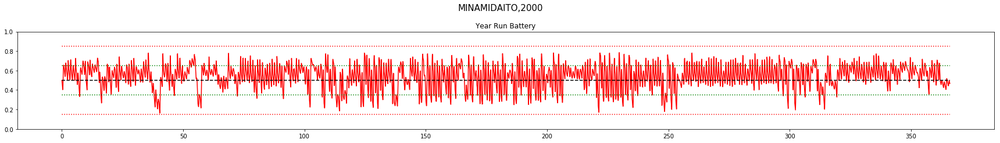



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


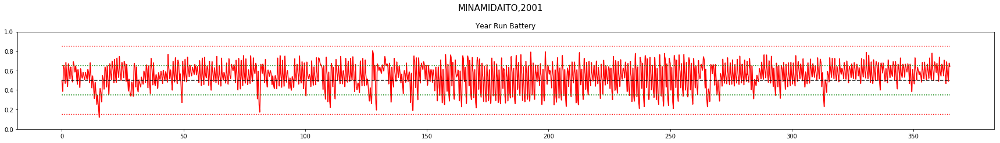



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


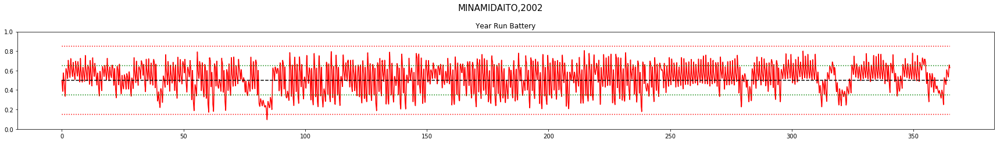



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


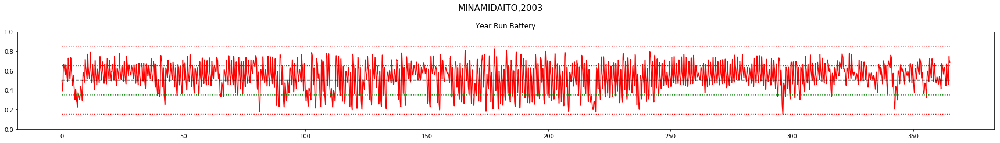



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


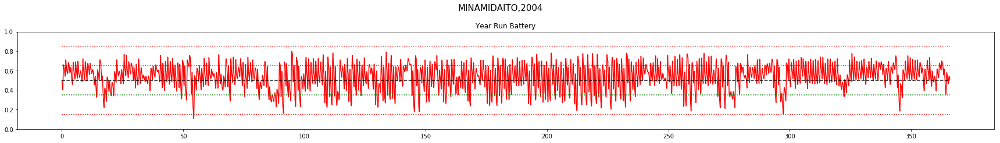



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


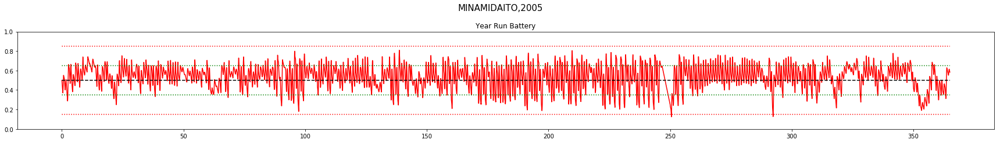



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


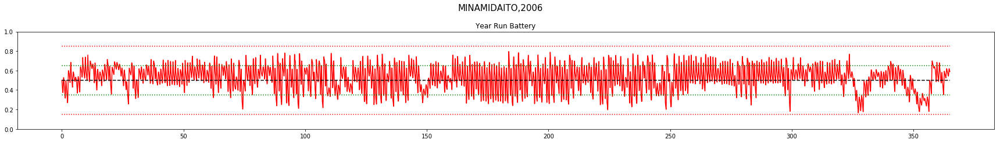



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


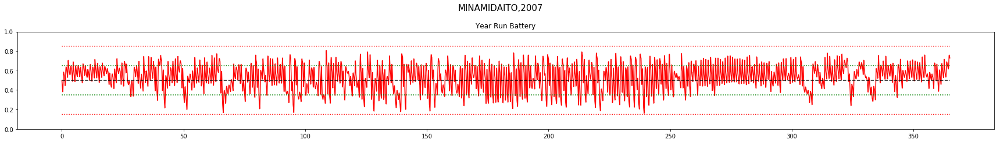



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


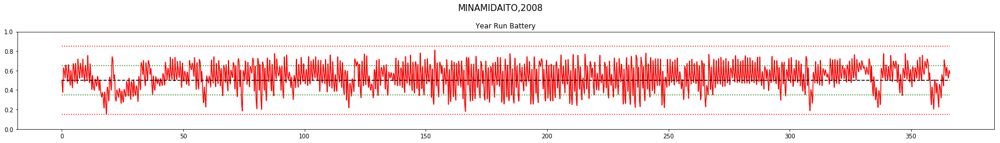



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


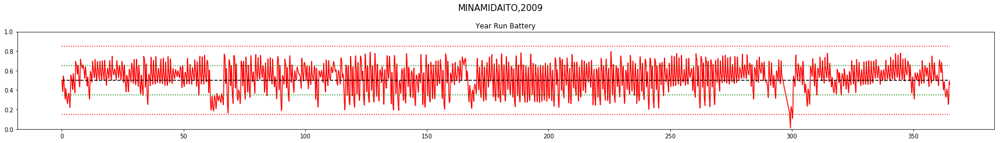



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


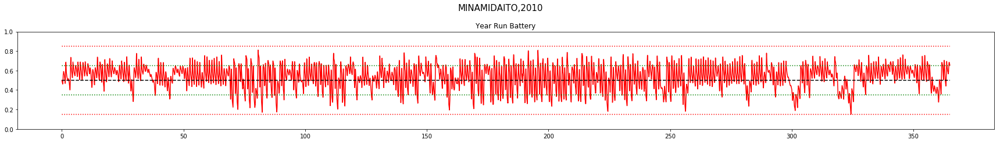



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


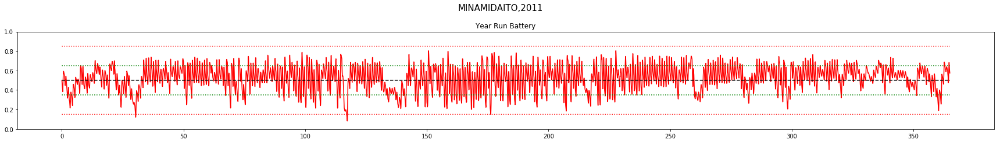



************************************
Day Violations           =      4
Battery Limit Violations =     53
Battery FULL Violations  =      0
Battery EMPTY Violations =     53


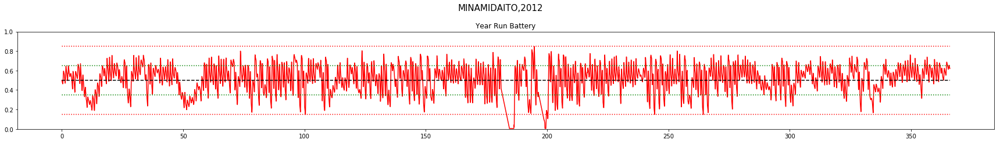



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


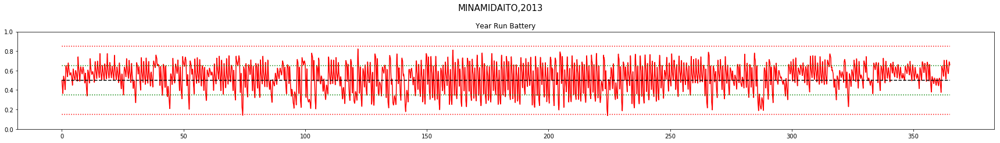



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


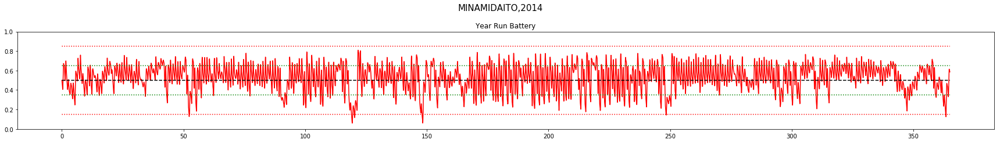



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


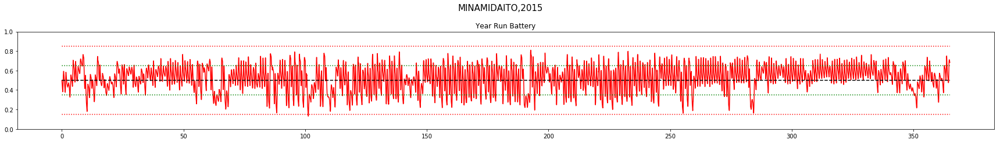



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


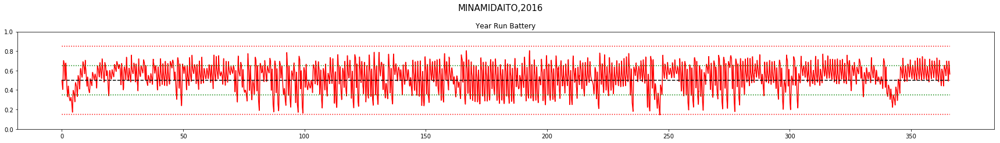



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


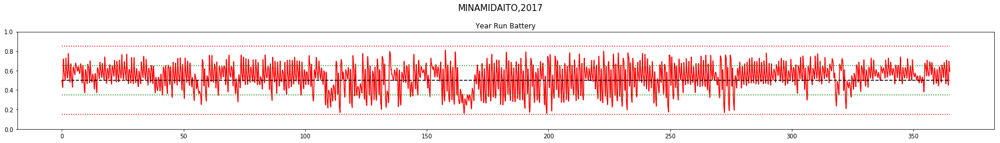



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


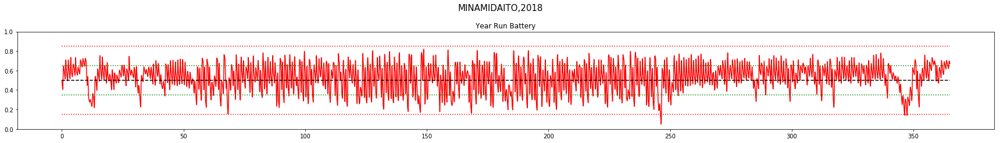



MINAMIDAITO
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.99		0	 0	0	0
2001	 0.99		0	 0	0	0
2002	 0.99		0	 0	0	0
2003	 1.0		0	 0	0	0
2004	 1.0		0	 0	0	0
2005	 0.99		0	 0	0	0
2006	 0.99		0	 0	0	0
2007	 1.0		0	 0	0	0
2008	 1.0		0	 0	0	0
2009	 0.99		0	 0	0	0
2010	 0.99		0	 0	0	0
2011	 0.99		0	 0	0	0
2012	 0.96		4	 53	53	0
2013	 0.99		0	 0	0	0
2014	 0.98		0	 0	0	0
2015	 0.99		0	 0	0	0
2016	 0.99		0	 0	0	0
2017	 0.99		0	 0	0	0
2018	 0.99		0	 0	0	0

TOTAL Day  Violations:   4.0
TOTAL Batt  Violations:  53.0
TOTAL EMPTY Violations:  53.0
TOTAL FULL  Violations:  0.0
************************************


In [40]:
#VALIDATION PHASE
print("***MEASURING PERFORMANCE OF THE MODEL***")
for LOCATION in ['wakkanai','aomori','tokyo','fukuoka','minamidaito']:
    results = np.empty(6)
    for YEAR in np.arange(2000,2019):
        capm      = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
        capm.eno  = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
        capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

        s, r, day_end, year_end = capm.reset()
        yr_test_record = np.empty(4)

        while True:
            a = dqn.choose_greedy_action(stdize(s))
            yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action
            s_, r, day_end, year_end = capm.step(a)
            if year_end:
                break
            s = s_

        yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
        yr_test_reward_rec = yr_test_record[:,2]
        yr_test_reward_rec = yr_test_reward_rec[::24] #annual average reward
        results = np.vstack((results, [int(YEAR), np.mean(yr_test_reward_rec), int(capm.violation_counter), int(capm.batt_violations), int(capm.batt_empty_counter), int(capm.batt_full_counter)]))
        print("\n\n************************************")
        print("Day Violations           = {:6d}".format(capm.violation_counter))
        print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
        print("Battery FULL Violations  = {:6d}".format(capm.batt_full_counter))
        print("Battery EMPTY Violations = {:6d}".format(capm.batt_empty_counter))
    ###########################################################################################
    ###########################################################################################
        #     Plot the reward and battery for the entire year run
        title = LOCATION.upper() + ',' + str(YEAR)
        NO_OF_DAYS = capm.eno.NO_OF_DAYS

        fig = plt.figure(figsize=(24,6))
        fig.suptitle(title, fontsize=15)

    #         ax1 = fig.add_subplot(211)
    #         ax1.plot(yr_test_reward_rec)
    #         ax1.set_title("\n\nYear Run Reward")
    #         ax1.set_ylim([-4,2])

        ax2 = fig.add_subplot(211)
        ax2.plot(yr_test_record[:,0],'r')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')

        ax2.set_title("\n\nYear Run Battery")
        ax2.set_ylim([0,1])
        plt.sca(ax2)
        plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
        fig.tight_layout()
        plt.show()
    ###########################################################################################
    ###########################################################################################


    results = np.delete(results,0,0)
    print("\n")
    print(LOCATION.upper())
    print('YEAR\tAVG_RWD\t\tVIOLATIONS\tEMPTY\tFULL')
    print('\t\t\tDAY\tBATT')

    for x in np.arange(0,results.shape[0]):
        print('{}\t {}\t\t{}\t {}\t{}\t{}'.format(int(results[x,0]), np.around(results[x,1],2), int(results[x,2]), int(results[x,3]), int(results[x,4]),  int(results[x,5]) ))

    print("\nTOTAL Day  Violations:  ",np.sum(results[:, 2]))
    print("TOTAL Batt  Violations: ",np.sum(results[:,3]))
    print("TOTAL EMPTY Violations: ",np.sum(results[:,4]))
    print("TOTAL FULL  Violations: ",np.sum(results[:,5]))
    print("************************************")